**Taller 2. Ciencia de datos MINE-4101**
- Nombres: Juan Carlos Cepeda y Jose Daniel Molano
- Sector economico: inmobiliaria
- Problema a resolver: Apoyo a una empresa de servicios inmobiliarios.


# 1 Entendimiento y preparación de los datos:

## 1.1 Desarrollo del entendimiento

### 1.1.1 Cargue de datos y librerias
Ejecutaremos las tareas de cargue de datos y librerias requeridas para la ejecución de los pasos siguientes.

In [1]:
# Montar Drive
#from google.colab import drive
#drive.mount('/content/drive')

# Importar librerías
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import scipy.stats as stats
from scipy.stats import ttest_ind, shapiro, mannwhitneyu, chi2_contingency
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LinearRegression
from sklearn.metrics import r2_score, mean_squared_error, mean_absolute_error
from sklearn.cluster import KMeans
from sklearn.preprocessing import StandardScaler


In [2]:
# Ruta al archivo (ajusta NOMBRE_DE_TU_CARPETA y el archivo CSV)
#ruta = '/content/drive/My Drive/Taller2/apartamentos.csv'
ruta = 'apartamentos.csv'

# Leer el CSV
apartamentos_df = pd.read_csv(ruta)

# Revisar el dataframe
print(apartamentos_df.shape)      # Tamaño (filas, columnas)
print(apartamentos_df.columns)    # Nombres de columnas
print(apartamentos_df.head())     # Primeras 5 filas

(43013, 46)
Index(['_id', 'codigo', 'tipo_propiedad', 'tipo_operacion', 'precio_venta',
       'area', 'habitaciones', 'banos', 'administracion', 'parqueaderos',
       'sector', 'estrato', 'antiguedad', 'latitud', 'longitud', 'direccion',
       'descripcion', 'website', 'last_view', 'datetime', 'url', 'timeline',
       'estado', 'compañia', 'precio_arriendo', 'jacuzzi', 'piso', 'closets',
       'chimenea', 'permite_mascotas', 'gimnasio', 'ascensor',
       'conjunto_cerrado', 'piscina', 'salon_comunal', 'terraza', 'vigilancia',
       'coords_modified', 'localidad', 'barrio', 'estacion_tm_cercana',
       'distancia_estacion_tm_m', 'is_cerca_estacion_tm', 'parque_cercano',
       'distancia_parque_m', 'is_cerca_parque'],
      dtype='object')
                        _id   codigo tipo_propiedad tipo_operacion  \
0  66d86c7eceda690e85508760  4133491    APARTAMENTO          VENTA   
1  66d86c7eceda690e85508761  3889852    APARTAMENTO          VENTA   
2  66d86c7eceda690e85508762  4386

### 1.1.2 Analisis de data relevante

#### 1.1.2.1 Análisis general de los datos

In [3]:
print("="*50)
print("Análisis Básico del Dataset")
print("="*50)

# 1. Información general del DataFrame
# Muestra el tipo de dato de cada columna y la cantidad de valores no nulos.
print("\n[1] Información General y Tipos de Datos (df.info()):")
apartamentos_df.info()

# 2. Conteo de valores nulos
# Calcula la cantidad de valores nulos y su porcentaje por columna.
print("\n" + "="*50)
print("\n[2] Conteo y Porcentaje de Valores Nulos por Columna:")

nulos_df = pd.DataFrame({
    'Nulos': apartamentos_df.isnull().sum(),
    'Porcentaje (%)': (apartamentos_df.isnull().sum() / len(apartamentos_df) * 100).round(2)
})

# Mostrar solo las columnas que tienen valores nulos
nulos_con_valores = nulos_df[nulos_df['Nulos'] > 0]

if nulos_con_valores.empty:
    print("\n¡Felicidades! No se encontraron valores nulos en el dataset.")
else:
    print(nulos_con_valores.sort_values(by='Nulos', ascending=False))

print("\n" + "="*50)
print("Análisis completado.")


Análisis Básico del Dataset

[1] Información General y Tipos de Datos (df.info()):
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 43013 entries, 0 to 43012
Data columns (total 46 columns):
 #   Column                   Non-Null Count  Dtype  
---  ------                   --------------  -----  
 0   _id                      43013 non-null  object 
 1   codigo                   43013 non-null  object 
 2   tipo_propiedad           43013 non-null  object 
 3   tipo_operacion           43013 non-null  object 
 4   precio_venta             27584 non-null  float64
 5   area                     43013 non-null  float64
 6   habitaciones             43012 non-null  float64
 7   banos                    43012 non-null  float64
 8   administracion           35088 non-null  float64
 9   parqueaderos             43012 non-null  float64
 10  sector                   41372 non-null  object 
 11  estrato                  43012 non-null  float64
 12  antiguedad               43003 non-null  object

Al parecer entre la data, los datos de precio_venta y precio_arriendo son excluyentes, vamos a validar esto.

In [4]:
# --- Identificación de registros ---
verbosity = False

print(apartamentos_df['tipo_operacion'].unique())

# 1. Registros que SÓLO tienen 'precio_venta' (y no 'precio_arriendo')
solo_venta = apartamentos_df[apartamentos_df['tipo_operacion'] == 'VENTA']
solo_venta = solo_venta[solo_venta['precio_venta'].notna() & solo_venta['precio_arriendo'].isna()]

# 2. Registros que SÓLO tienen 'precio_arriendo' (y no 'precio_venta')
solo_arriendo = apartamentos_df[apartamentos_df['tipo_operacion'] == 'ARRIENDO']
solo_arriendo = solo_arriendo[solo_arriendo['precio_venta'].isna() & solo_arriendo['precio_arriendo'].notna()]

# 3. Registros que tienen AMBOS 'precio_venta' y 'precio_arriendo'
ambos_precios = apartamentos_df[apartamentos_df['tipo_operacion'] == 'VENTA Y ARRIENDO']
ambos_precios = ambos_precios[ambos_precios['precio_venta'].notna() & ambos_precios['precio_arriendo'].notna()]

# 4. Registros que NO tienen NINGUNO de los dos precios
sin_precios = apartamentos_df[apartamentos_df['precio_venta'].isna() & apartamentos_df['precio_arriendo'].isna()]

# --- Presentación de resultados ---
print(f"Total de registros: {len(apartamentos_df)}\n")
print("-" * 40)

print(f"1. Registros que SÓLO tienen precio de venta: {len(solo_venta)}")
if not solo_venta.empty and verbosity:
    print(solo_venta)
print("-" * 40)

print(f"2. Registros que SÓLO tienen precio de arriendo: {len(solo_arriendo)}")
if not solo_arriendo.empty and verbosity:
    print(solo_arriendo)
print("-" * 40)

print(f"3. Registros que tienen AMBOS precios (venta y arriendo): {len(ambos_precios)}")
if not ambos_precios.empty and verbosity:
    print(ambos_precios)
print("-" * 40)

print(f"4. Registros que NO tienen NINGÚN precio: {len(sin_precios)}")
if not sin_precios.empty and verbosity:
    print(sin_precios)
print("-" * 40)

['VENTA' 'VENTA Y ARRIENDO' 'ARRIENDO']
Total de registros: 43013

----------------------------------------
1. Registros que SÓLO tienen precio de venta: 27181
----------------------------------------
2. Registros que SÓLO tienen precio de arriendo: 15426
----------------------------------------
3. Registros que tienen AMBOS precios (venta y arriendo): 228
----------------------------------------
4. Registros que NO tienen NINGÚN precio: 3
----------------------------------------


Según la información identificada de los datos existen varias columnas  contienen nulos, sin embargo, en lugar de definir una estrategía generica de tratamiento de estos nulos trataremos de buscar las variables más relevantes primero y tratar de manera especifica a cada columna que sea relevante.

Adicionalmente, al final del análisis trataremos de identificar si existe una relación significativa entre precio_arriendo y precio_venta, que nos permita usar los arriendos como parte del entrenamiento.

#### 1.1.2.2 Analisis del comportamiento de la variable **precio de venta**

count    2.749800e+04
mean     2.370165e+09
std      5.582896e+10
min      1.000000e+06
25%      4.051418e+08
50%      7.000000e+08
75%      1.340000e+09
max      4.250000e+12
Name: precio_venta, dtype: float64


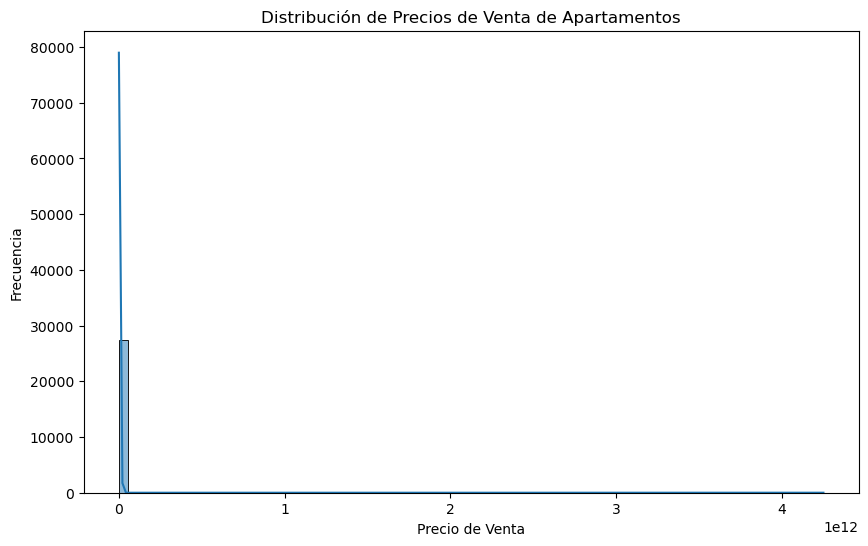

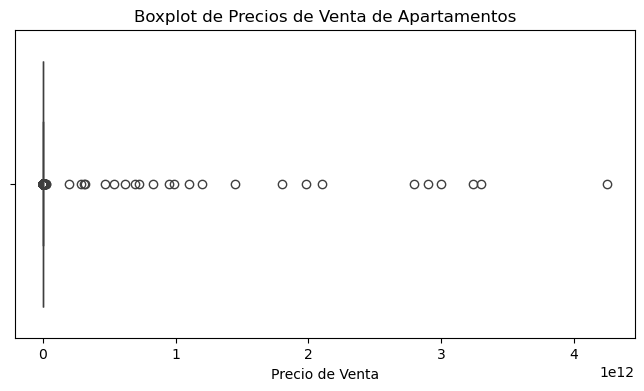

In [5]:
ventas_df = apartamentos_df.copy()
ventas_df = ventas_df.dropna(subset=['precio_venta'])
ventas_df['precio_venta'] = ventas_df['precio_venta'].astype('int64')
ventas_df = ventas_df[ventas_df['tipo_operacion'] != 'ARRIENDO']

print(ventas_df['precio_venta'].describe())

plt.figure(figsize=(10, 6))
sns.histplot(ventas_df['precio_venta'], bins=80, kde=True)
plt.title('Distribución de Precios de Venta de Apartamentos')
plt.xlabel('Precio de Venta')
plt.ylabel('Frecuencia')
plt.show()

# dibujando boxplot
plt.figure(figsize=(8, 4))
sns.boxplot(x=ventas_df['precio_venta'])
plt.title('Boxplot de Precios de Venta de Apartamentos')
plt.xlabel('Precio de Venta')
plt.show()

Con el fin de conseguir un entendimiento gráfico mas detallado de los precios de venta removeremos los valores extremos y reconstruiremos las gráficas.

count    2.555700e+04
mean     8.372876e+08
std      5.935541e+08
min      1.000000e+06
25%      3.900000e+08
50%      6.500000e+08
75%      1.185000e+09
max      2.723000e+09
Name: precio_venta, dtype: float64


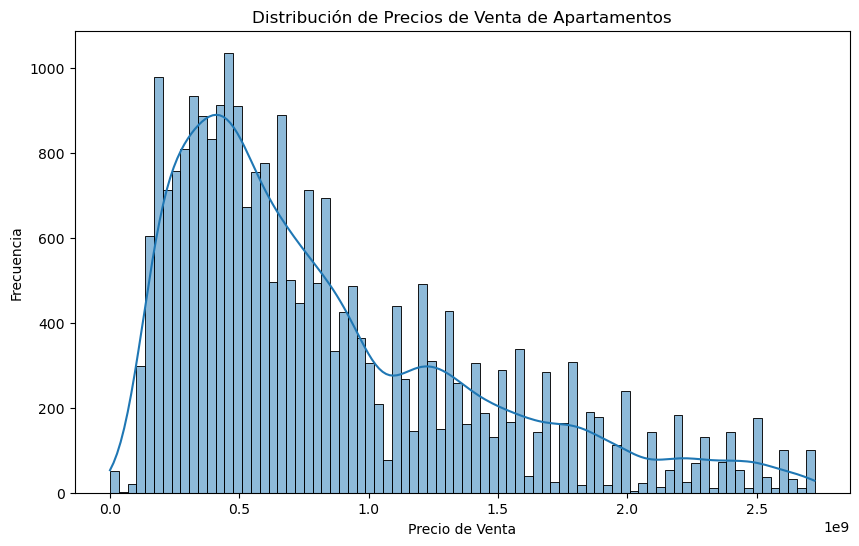

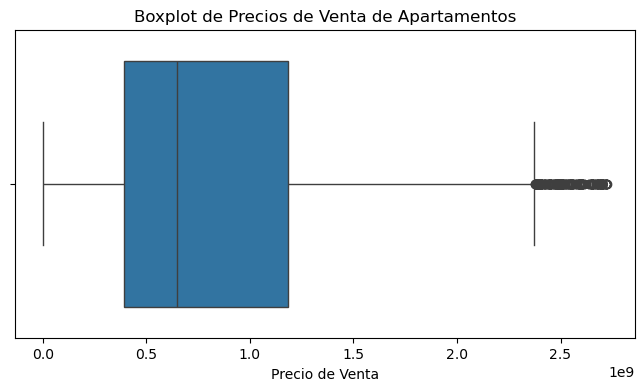

In [6]:
# Removiendo valores extremos para análisis gráfico
q1 = ventas_df['precio_venta'].quantile(0.25)
q3 = ventas_df['precio_venta'].quantile(0.75)
iqr = q3 - q1
lower_bound = q1 - 1.5 * iqr
upper_bound = q3 + 1.5 * iqr
ventas_df_no_extremos = ventas_df[(ventas_df['precio_venta'] > lower_bound) & (ventas_df['precio_venta'] < upper_bound)]

print(ventas_df_no_extremos['precio_venta'].describe())

plt.figure(figsize=(10, 6))
sns.histplot(ventas_df_no_extremos['precio_venta'], bins=80, kde=True)
plt.title('Distribución de Precios de Venta de Apartamentos')
plt.xlabel('Precio de Venta')
plt.ylabel('Frecuencia')
plt.show()

# dibujando boxplot
plt.figure(figsize=(8, 4))
sns.boxplot(x=ventas_df_no_extremos['precio_venta'])
plt.title('Boxplot de Precios de Venta de Apartamentos')
plt.xlabel('Precio de Venta')
plt.show()

#### 1.1.2.3 Identificador de variables mas relevantes con respecto a precio de venta

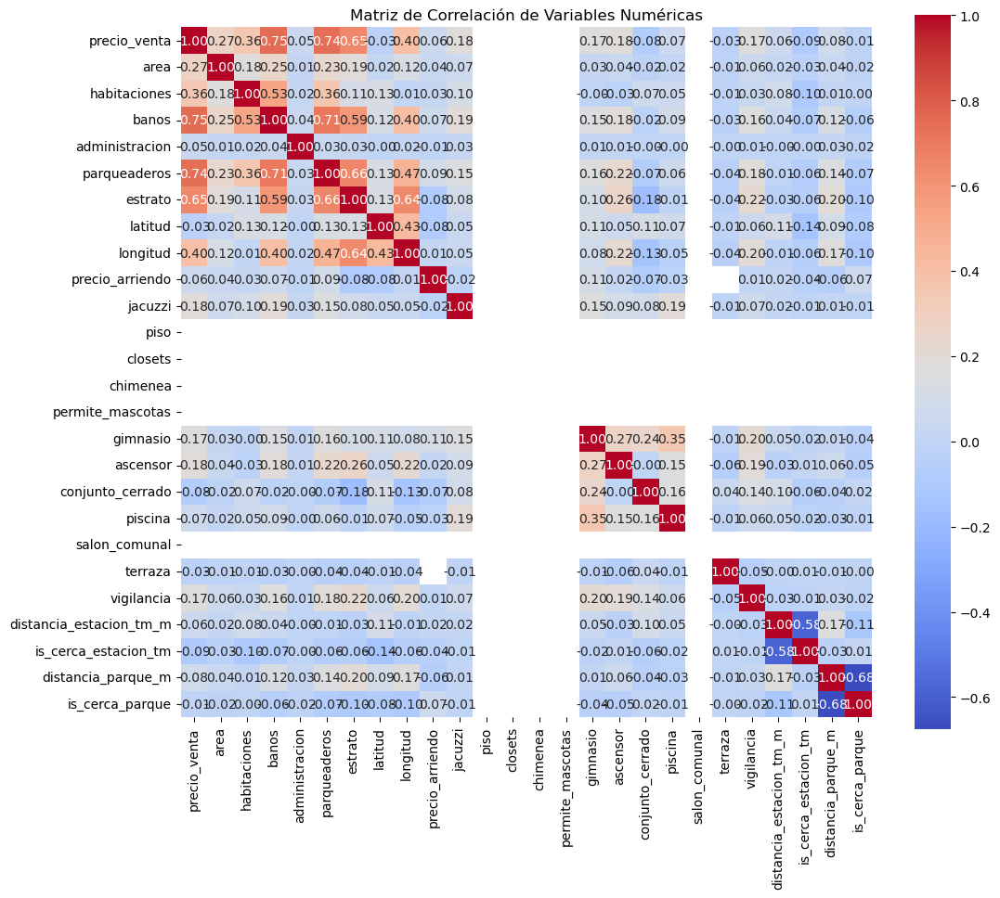

Variables Numéricas Significativas con alta correlación con 'precio_venta':
['area', 'habitaciones', 'banos', 'parqueaderos', 'estrato', 'longitud']


In [7]:
# --- EDA PARA IDENTIFICAR VARIABLES MAS SIGNIFICATIVAS --- #
correlation_matrix = ventas_df_no_extremos.select_dtypes(include=[np.number]).corr()
plt.figure(figsize=(12, 10))
sns.heatmap(correlation_matrix, annot=True, fmt=".2f", cmap='coolwarm', square=True)
plt.title('Matriz de Correlación de Variables Numéricas')
plt.show()

# Selección de variables numéricas con alta correlación con 'precio_venta'
correlation_threshold = 0.25
significant_numerical_vars = correlation_matrix.index[abs(correlation_matrix["precio_venta"]) > correlation_threshold].tolist()
significant_numerical_vars.remove('precio_venta')
print("Variables Numéricas Significativas con alta correlación con 'precio_venta':")
print(significant_numerical_vars)

In [8]:
# Debido a que longitud debería estar vinculada a latitud agregaremos al ultima al listado de variables
significant_numerical_vars.append('latitud')

In [9]:
def hypothesis_test_categorical(df, main_var, var):
    reference = [0.1, 0.3, 0.5]

    #print(f"\nHipótesis de independencia entre '{main_var}' y '{var}':")

    contingency_var_table = pd.crosstab(df[main_var], df[var])

    chi2, pvalue, _, expected = chi2_contingency(contingency_var_table, correction=False)
    n = contingency_var_table.values.sum()
    r, k = contingency_var_table.shape

    phi2 = chi2 / n
    phi2_corr = max(0, phi2 - ((k - 1) * (r - 1)) / (n - 1))
    r_corr = r - ((r - 1) ** 2) / (n - 1)
    k_corr = k - ((k - 1) ** 2) / (n - 1)

    cramers_v = np.sqrt(phi2_corr / max(1e-12, min(r_corr - 1, k_corr - 1))) # Cramér's V, bias corrected
    magnitude = min(reference, key=lambda r: abs(r - cramers_v))

    #print(f"chi-square: {chi2:.4f}")
    #print(f"p-value:    {pvalue:.4g}")
    #print(f"Cramér's V: {cramers_v:.3f}")
    #print(f"Magnitud:   {magnitude}")

    return cramers_v, pvalue, magnitude

In [10]:
# Identificando variables categóricas significativas relacionadas con 'precio_venta'
categorical_vars = ventas_df_no_extremos.select_dtypes(include=['object']).columns.tolist()
significant_categorical_vars = []
for var in categorical_vars:
    cramers_var, pvalue_var, magnitude = hypothesis_test_categorical(ventas_df_no_extremos, 'precio_venta', var)
    print(f"Variable: {var}, p-value: {pvalue_var:.4g}, Cramér's V: {cramers_var:.3f}")
    if pvalue_var <= 0.05:
        match magnitude:
            case 0.1:
                print("\tTHE EFFECT SIZE IS SMALL.")
            case 0.3:
                print("\tTHE EFFECT SIZE IS MODERATE.")
            case 0.5:
                print("\tTHE EFFECT SIZE IS LARGE.")
                significant_categorical_vars.append(var)
    else:
        print("\tNO ENOUGH EVIDENCE TO DECIDE.")

print(f"\nVariables Categóricas Significativas relacionadas con 'precio_venta':")
print(significant_categorical_vars)

Variable: _id, p-value: 0.4138, Cramér's V: 0.000
	NO ENOUGH EVIDENCE TO DECIDE.
Variable: codigo, p-value: 0.4138, Cramér's V: 0.000
	NO ENOUGH EVIDENCE TO DECIDE.
Variable: tipo_propiedad, p-value: 0, Cramér's V: 0.624
	THE EFFECT SIZE IS LARGE.
Variable: tipo_operacion, p-value: 1, Cramér's V: 0.000
	NO ENOUGH EVIDENCE TO DECIDE.
Variable: sector, p-value: 0, Cramér's V: 0.487
	THE EFFECT SIZE IS LARGE.
Variable: antiguedad, p-value: 0, Cramér's V: 0.518
	THE EFFECT SIZE IS LARGE.
Variable: direccion, p-value: 3.801e-16, Cramér's V: 0.328
	THE EFFECT SIZE IS MODERATE.
Variable: descripcion, p-value: 1, Cramér's V: 0.000
	NO ENOUGH EVIDENCE TO DECIDE.
Variable: website, p-value: 0, Cramér's V: 0.581
	THE EFFECT SIZE IS LARGE.
Variable: last_view, p-value: 0.4138, Cramér's V: 0.000
	NO ENOUGH EVIDENCE TO DECIDE.
Variable: datetime, p-value: 0.4138, Cramér's V: 0.000
	NO ENOUGH EVIDENCE TO DECIDE.
Variable: url, p-value: 0.27, Cramér's V: 0.337
	NO ENOUGH EVIDENCE TO DECIDE.
Variable: 

#### 1.1.2.4 Imputación de datos en las variables significativas


In [11]:
significant_vars = significant_numerical_vars + significant_categorical_vars
for var in significant_numerical_vars:
    n_nans = apartamentos_df[var].isnull().sum()
    print(f"Variable Num: {var}, Valores NAN: {n_nans}")

for var in significant_categorical_vars:
    n_nans = apartamentos_df[var].isnull().sum()
    print(f"Variable Cat: {var}, Valores NAN: {n_nans}")

Variable Num: area, Valores NAN: 0
Variable Num: habitaciones, Valores NAN: 1
Variable Num: banos, Valores NAN: 1
Variable Num: parqueaderos, Valores NAN: 1
Variable Num: estrato, Valores NAN: 1
Variable Num: longitud, Valores NAN: 0
Variable Num: latitud, Valores NAN: 0
Variable Cat: tipo_propiedad, Valores NAN: 0
Variable Cat: sector, Valores NAN: 1641
Variable Cat: antiguedad, Valores NAN: 10
Variable Cat: website, Valores NAN: 2
Variable Cat: estado, Valores NAN: 796
Variable Cat: localidad, Valores NAN: 0


De este resultado, identificamos que **Sector** y **estado** tienen un número considerable de nulos y sería preferible no perder esta información entonces procederemos a revisar y definir una estrategía para manejar estos datos.

##### 1.1.2.4.1 Tratamiento de la variable Sector

In [12]:
print("20 primeros valores únicos en la columna 'sector':")
print(apartamentos_df['sector'].unique()[:20])

# Dataframe con datos de Sector nulos
apartamentos_sin_sector = apartamentos_df[apartamentos_df['sector'].isnull()]
print("\nCantidad de apartamentos sin Sector: " + str(len(apartamentos_sin_sector)))

print(apartamentos_sin_sector['sector'].unique())

print("\n20 primeros valores únicos en la columna 'Barrio': " + str(len(apartamentos_sin_sector['barrio'].unique())))
print(apartamentos_sin_sector['barrio'].unique()[:20])

print("\n20 primeros alores únicos en la columna 'Direccion': " + str(len(apartamentos_sin_sector['direccion'].unique())))
print(apartamentos_sin_sector['direccion'].unique()[:20])


20 primeros valores únicos en la columna 'sector':
['BRITALIA' 'SAN CRISTOBAL NORTE' 'LA SABANA' 'TIBABUYES' 'VERBENAL'
 'TINTAL SUR' 'SUBA' 'CHAPINERO' 'GARCES NAVAS' 'QUINTA PAREDES'
 'LOS CEDROS' 'CHICO LAGO' 'CALANDAIMA' 'BOSA CENTRAL' 'EL RINCON'
 'SAGRADO CORAZON' 'CASTILLA' 'BOYACA REAL' 'CIUDAD USME' 'LOS ALCAZARES']

Cantidad de apartamentos sin Sector: 1641
[nan]

20 primeros valores únicos en la columna 'Barrio': 498
['CENTRO FONTIBON' 'SANTA BARBARA OCCIDENTAL' 'SAN PATRICIO'
 'S.C. BELLAVISTA' 'PUENTE LARGO III SECTOR' 'CERROS DE LOS ALPES'
 'CHICO RESERVADO' 'SANTA ANA OCCIDENTAL' 'S.C. CLUB DE LOS LAGARTOS'
 'CAOBOS SALAZAR' 'S.C. BATAN' 'URB. SAN PEDRO' 'LA GRANJA NORTE'
 'ALAMEDAS DE TIMIZA II' 'BOSCONIA' 'CUNDINAMARCA'
 'VILLA LILIANA EL VERGEL' 'S.C. LAGO GAITAN' 'S.C. PORTALES DEL NORTE'
 'SANTA BARBARA CENTRAL III SECTOR']

20 primeros alores únicos en la columna 'Direccion': 1
[nan]


Podemos concluir que cuando no esta diligenciado el sector tampoco disponemos de la dirección, procederemos para validar sin con los datos existentes que si tienen sector y barrio diligenciado podemos inferir el sector.

In [13]:
sector_barrio_relacion = apartamentos_df[apartamentos_df['sector'].notnull() & apartamentos_df['barrio'].notnull()]
sector_barrio_relacion = sector_barrio_relacion[['sector', 'barrio']]
sector_barrio_relacion = sector_barrio_relacion.drop_duplicates()

# Buscaremos si en el dataframe apartamentos_sin_sector podemos completar el sector usando como referencia el df sector_barrio_relacion
for index, row in apartamentos_sin_sector[:20].iterrows():
    barrio = row['barrio']
    sector_relacionado = sector_barrio_relacion[sector_barrio_relacion['barrio'] == barrio]['sector'].values
    if len(sector_relacionado) > 0:
        apartamentos_sin_sector.at[index, 'sector']
        sector_relacionado = sector_relacionado[0]
        apartamentos_sin_sector.at[index, 'sector'] = sector_relacionado
        print(f"Barrio: {barrio}, Sector Relacionado: {sector_relacionado}")
    else:
        print(f"No se encontró un sector para el barrio: {barrio}")

Barrio: CENTRO FONTIBON, Sector Relacionado: FONTIBON TINTAL
Barrio: SANTA BARBARA OCCIDENTAL, Sector Relacionado: SANTA BARBARA
Barrio: SAN PATRICIO, Sector Relacionado: SANTA BARBARA
Barrio: S.C. BELLAVISTA, Sector Relacionado: CHICO
Barrio: PUENTE LARGO III SECTOR, Sector Relacionado: NIZA ALHAMBRA
Barrio: CERROS DE LOS ALPES, Sector Relacionado: SANTA BARBARA
Barrio: CHICO RESERVADO, Sector Relacionado: CHICO
Barrio: SANTA ANA OCCIDENTAL, Sector Relacionado: SANTA BARBARA
Barrio: S.C. CLUB DE LOS LAGARTOS, Sector Relacionado: EL RINCON
Barrio: CAOBOS SALAZAR, Sector Relacionado: USAQUEN
Barrio: S.C. BATAN, Sector Relacionado: NIZA ALHAMBRA
Barrio: URB. SAN PEDRO, Sector Relacionado: SAN JOSE DE BAVARIA
Barrio: LA GRANJA NORTE, Sector Relacionado: LA URIBE
Barrio: SANTA BARBARA OCCIDENTAL, Sector Relacionado: SANTA BARBARA
Barrio: ALAMEDAS DE TIMIZA II, Sector Relacionado: TIMIZA LA ALQUERIA
Barrio: BOSCONIA, Sector Relacionado: CASTILLA
Barrio: CUNDINAMARCA, Sector Relacionado: CEN

Basado en el resultado inicial del match generado, vemos como una buena opción completar los datos de sector con el Dataframe *sector_barrio_relacion*, procedemos a completar el dataframe original y volver a evaluar la cantidad de nulls

In [14]:
# Cuando la variable sector este vacia, buscar en el dataframe sector_barrio_relacion, si el barrio existe identifique el sector corresondiente.

for index, row in apartamentos_df.iterrows():
    if pd.isnull(row['sector']):
        barrio = row['barrio']
        sector_relacionado = sector_barrio_relacion[sector_barrio_relacion['barrio'] == barrio]['sector'].values
        if len(sector_relacionado) > 0:
            sector_relacionado = sector_relacionado[0]
            apartamentos_df.at[index, 'sector'] = sector_relacionado

In [15]:
n_nans = apartamentos_df['sector'].isnull().sum()
print(f"Valores NAN: {n_nans}")

Valores NAN: 70


Al ser un número tan reducido y sin una posibilidad sencilla de entregar valores estos datos serán descartados para poder desarrollar el modelo en la siguiente etapa.

##### 1.1.2.4.2 Tratamiento de la variable Estado

In [16]:
print(apartamentos_df['estado'].unique())

n_nans = apartamentos_df['estado'].isnull().sum()
print(f"Valores NAN de estado: {n_nans}")

aptos_nuevos = apartamentos_df[apartamentos_df['estado'] == 'NUEVO']
aptos_usados = apartamentos_df[apartamentos_df['estado'] == 'USADO']

print(f"Cantidad de apartamentos nuevos: {len(aptos_nuevos)}")
print(f"Cantidad de apartamentos usados: {len(aptos_usados)}")

print(f"Valores de antiguedad para aptos_nuevos: {aptos_nuevos['antiguedad'].unique()}")
print(f"Valores de antiguedad para aptos_usados: {aptos_usados['antiguedad'].unique()}")

[nan 'USADO' 'NUEVO']
Valores NAN de estado: 796
Cantidad de apartamentos nuevos: 226
Cantidad de apartamentos usados: 41991
Valores de antiguedad para aptos_nuevos: ['PARA ESTRENAR' 'SOBRE PLANOS' 'EN CONSTRUCCION']
Valores de antiguedad para aptos_usados: ['ENTRE 10 Y 20 ANOS' 'MAS DE 20 ANOS' 'ENTRE 5 Y 10 ANOS' 'REMODELADO'
 'ENTRE 0 Y 5 ANOS' nan]


Las variables de antiguedad y estado estan muy relacionadas, pero `estado` tiene una mejor asociación que `antiguedad` (Basado en el número de Cramer), razón por la cual completaremos el valor de `estado` y descartaremos `antiguedad`

In [17]:
relacion_estado_antiguedad = apartamentos_df[apartamentos_df['estado'].notnull() & apartamentos_df['antiguedad'].notnull()]
relacion_estado_antiguedad = relacion_estado_antiguedad[['estado', 'antiguedad']]
relacion_estado_antiguedad = relacion_estado_antiguedad.drop_duplicates()

print(relacion_estado_antiguedad)

for index, row in apartamentos_df.iterrows():
    if pd.isnull(row['estado']):
        antiguedad = row['antiguedad']
        antiguedad_relacionado = relacion_estado_antiguedad[relacion_estado_antiguedad['antiguedad'] == antiguedad]['estado'].values
        if len(antiguedad_relacionado) > 0:
            antiguedad_relacionado = antiguedad_relacionado[0]
            apartamentos_df.at[index, 'estado'] = antiguedad_relacionado
            print(f"Antiguedad: {antiguedad}, Estado Relacionado: {antiguedad_relacionado}")
        else:
            print(f"No se encontró un estado para la antiguedad: {antiguedad}")

# Removemos antiguedad de la lista de variables categoricas significativas
significant_categorical_vars.remove('antiguedad')

    estado          antiguedad
476  USADO  ENTRE 10 Y 20 ANOS
478  USADO      MAS DE 20 ANOS
481  USADO   ENTRE 5 Y 10 ANOS
482  USADO          REMODELADO
487  USADO    ENTRE 0 Y 5 ANOS
550  NUEVO       PARA ESTRENAR
551  NUEVO        SOBRE PLANOS
592  NUEVO     EN CONSTRUCCION
Antiguedad: ENTRE 10 Y 20 ANOS, Estado Relacionado: USADO
Antiguedad: MAS DE 20 ANOS, Estado Relacionado: USADO
Antiguedad: ENTRE 0 Y 5 ANOS, Estado Relacionado: USADO
Antiguedad: ENTRE 10 Y 20 ANOS, Estado Relacionado: USADO
Antiguedad: MAS DE 20 ANOS, Estado Relacionado: USADO
Antiguedad: ENTRE 10 Y 20 ANOS, Estado Relacionado: USADO
Antiguedad: ENTRE 5 Y 10 ANOS, Estado Relacionado: USADO
Antiguedad: ENTRE 10 Y 20 ANOS, Estado Relacionado: USADO
Antiguedad: ENTRE 5 Y 10 ANOS, Estado Relacionado: USADO
Antiguedad: ENTRE 10 Y 20 ANOS, Estado Relacionado: USADO
Antiguedad: ENTRE 10 Y 20 ANOS, Estado Relacionado: USADO
Antiguedad: ENTRE 0 Y 5 ANOS, Estado Relacionado: USADO
Antiguedad: ENTRE 10 Y 20 ANOS, Estado 

##### 1.1.2.4.3 Identificando pertinencia para usar precio_arriendo como predictor de precio_venta

Desde el contexto de negocio podemos hacer la hipotesis, que el valor del arriendo, puede estar fuertemente relacionado con el precio de venta, para tal fin llevaremos a cabo una analisis para validar esta hipotesis.

Text(0, 0.5, 'Frecuencia')

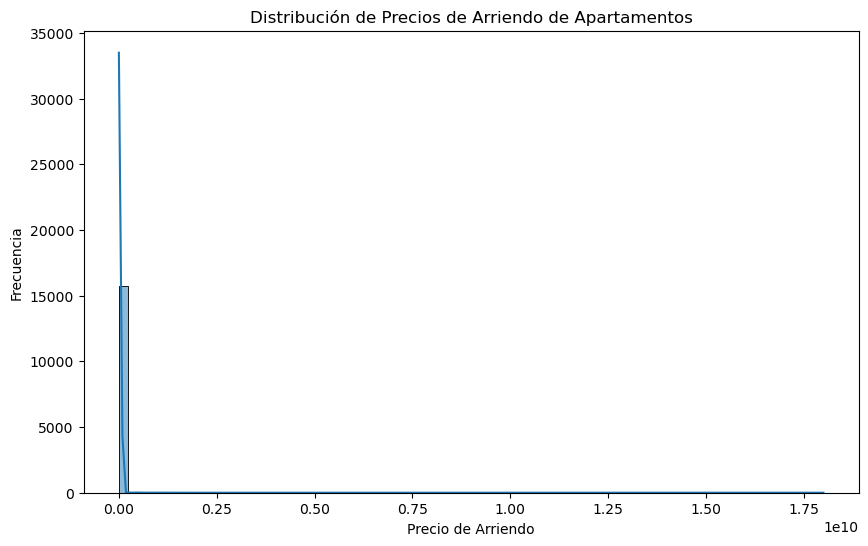

In [18]:
# Pintando la distribución de precios de arriendo y el comportamiento de la misma

plt.figure(figsize=(10, 6))
sns.histplot(apartamentos_df['precio_arriendo'], bins=80, kde=True)
plt.title('Distribución de Precios de Arriendo de Apartamentos')
plt.xlabel('Precio de Arriendo')
plt.ylabel('Frecuencia')

Retirando valores extremos para hacer una mejor visualización

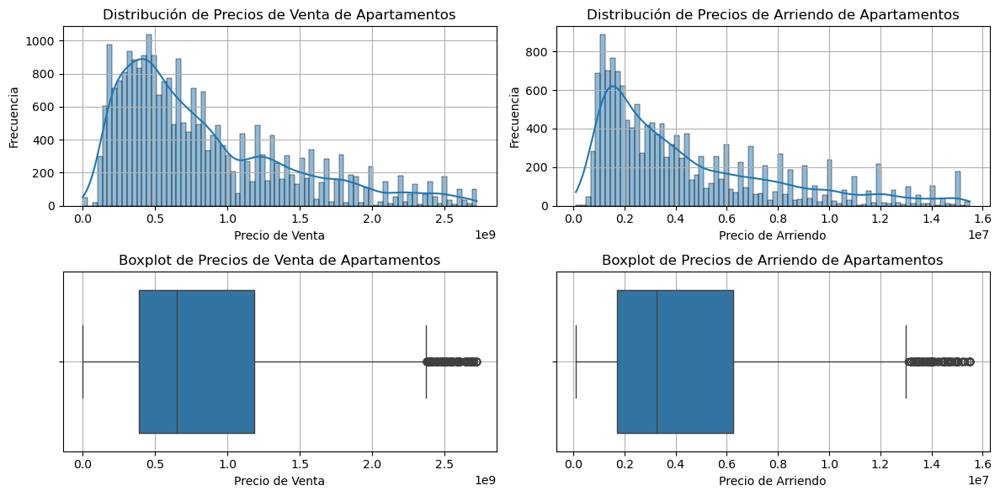

In [19]:
# Removiendo valores extremos

q1 = apartamentos_df['precio_arriendo'].quantile(0.25)
q3 = apartamentos_df['precio_arriendo'].quantile(0.75)
iqr = q3 - q1
lower_bound = q1 - 1.5 * iqr
upper_bound = q3 + 1.5 * iqr
apartamentos_df_pa_no_extremos = apartamentos_df[(apartamentos_df['precio_arriendo'] > lower_bound) & (apartamentos_df['precio_arriendo'] < upper_bound)]

# Graficando uno al lado del otro (distribución y box) para validar que las distribuciones realmente son similares
fig, axs = plt.subplots(2, 2, figsize=(12, 6))

# Distribución de precios de venta
sns.histplot(ventas_df_no_extremos['precio_venta'], bins=80, kde=True, ax=axs[0, 0])
axs[0, 0].set_title('Distribución de Precios de Venta de Apartamentos')
axs[0, 0].set_xlabel('Precio de Venta')
axs[0, 0].set_ylabel('Frecuencia')
axs[0, 0].grid(True)

# Distribución de precios de arriendo
sns.histplot(apartamentos_df_pa_no_extremos['precio_arriendo'], bins=80, kde=True, ax=axs[0, 1])
axs[0, 1].set_title('Distribución de Precios de Arriendo de Apartamentos')
axs[0, 1].set_xlabel('Precio de Arriendo')
axs[0, 1].set_ylabel('Frecuencia')
axs[0, 1].grid(True)

# Cajas de precios de venta
sns.boxplot(x=ventas_df_no_extremos['precio_venta'], ax=axs[1, 0])
axs[1, 0].set_title('Boxplot de Precios de Venta de Apartamentos')
axs[1, 0].set_xlabel('Precio de Venta')
axs[1, 0].grid(True)

# Cajas de precios de arriendo
sns.boxplot(x=apartamentos_df_pa_no_extremos['precio_arriendo'], ax=axs[1, 1])
axs[1, 1].set_title('Boxplot de Precios de Arriendo de Apartamentos')
axs[1, 1].set_xlabel('Precio de Arriendo')
axs[1, 1].grid(True)

plt.tight_layout()
plt.show()


Existe un número limitado de datos que tienen ambos precios, generaremos las mismas graficas para estos datos.

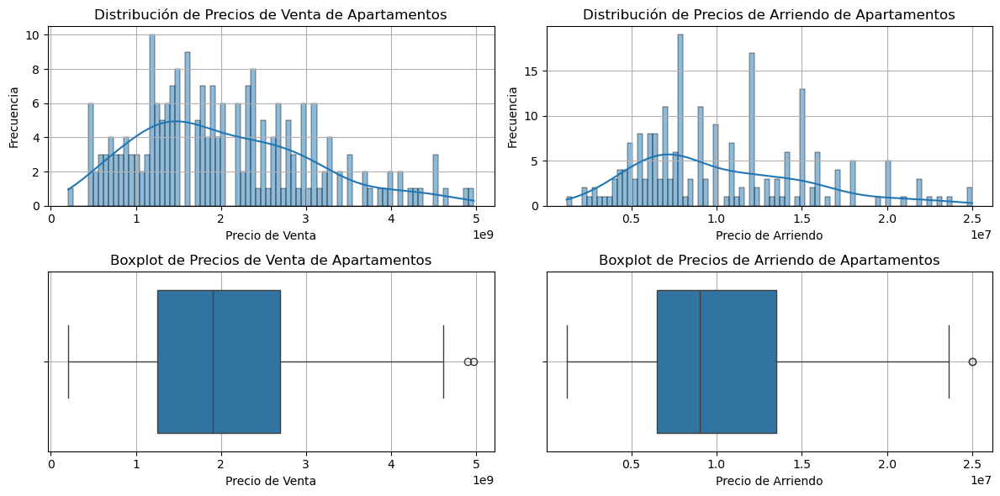

In [20]:
q1 = ambos_precios['precio_arriendo'].quantile(0.25)
q3 = ambos_precios['precio_arriendo'].quantile(0.75)
iqr = q3 - q1
lower_bound = q1 - 1.5 * iqr
upper_bound = q3 + 1.5 * iqr
ambos_precios = ambos_precios[(ambos_precios['precio_arriendo'] > lower_bound) & (ambos_precios['precio_arriendo'] < upper_bound)]

q1 = ambos_precios['precio_venta'].quantile(0.25)
q3 = ambos_precios['precio_venta'].quantile(0.75)
iqr = q3 - q1
lower_bound = q1 - 1.5 * iqr
upper_bound = q3 + 1.5 * iqr
ambos_precios = ambos_precios[(ambos_precios['precio_venta'] > lower_bound) & (ambos_precios['precio_venta'] < upper_bound)]


# Graficando uno al lado del otro (distribución y box) para validar que las distribuciones realmente son similares
fig, axs = plt.subplots(2, 2, figsize=(12, 6))

# Distribución de precios de venta
sns.histplot(ambos_precios['precio_venta'], bins=80, kde=True, ax=axs[0, 0])
axs[0, 0].set_title('Distribución de Precios de Venta de Apartamentos')
axs[0, 0].set_xlabel('Precio de Venta')
axs[0, 0].set_ylabel('Frecuencia')
axs[0, 0].grid(True)

# Distribución de precios de arriendo
sns.histplot(ambos_precios['precio_arriendo'], bins=80, kde=True, ax=axs[0, 1])
axs[0, 1].set_title('Distribución de Precios de Arriendo de Apartamentos')
axs[0, 1].set_xlabel('Precio de Arriendo')
axs[0, 1].set_ylabel('Frecuencia')
axs[0, 1].grid(True)

# Cajas de precios de venta
sns.boxplot(x=ambos_precios['precio_venta'], ax=axs[1, 0])
axs[1, 0].set_title('Boxplot de Precios de Venta de Apartamentos')
axs[1, 0].set_xlabel('Precio de Venta')
axs[1, 0].grid(True)

# Cajas de precios de arriendo
sns.boxplot(x=ambos_precios['precio_arriendo'], ax=axs[1, 1])
axs[1, 1].set_title('Boxplot de Precios de Arriendo de Apartamentos')
axs[1, 1].set_xlabel('Precio de Arriendo')
axs[1, 1].grid(True)

plt.tight_layout()
plt.show()

In [21]:
# Depurando valores bajos extremos en precio de venta
min = ambos_precios['precio_venta'].min()
max = ambos_precios['precio_venta'].max()
print(f"Minimo: {min}, Maximo: {max}")

print(ambos_precios[['precio_venta','precio_arriendo']].sort_values(by='precio_venta', ascending=True))


Minimo: 205000000.0, Maximo: 4975000000.0
       precio_venta  precio_arriendo
17897  2.050000e+08        1200000.0
19273  4.500000e+08        4500000.0
16707  4.500000e+08        2350000.0
18004  4.750000e+08        2500000.0
18921  4.970000e+08        3700000.0
...             ...              ...
13080  4.500000e+09       22000000.0
3809   4.500000e+09       25000000.0
15429  4.620000e+09       25000000.0
13444  4.900000e+09       22000000.0
6362   4.975000e+09       20000000.0

[217 rows x 2 columns]


Al parecer en algunos casos el precio de venta y el precio de arriendo estan en ambos registros, adicionalmente, varios precios de venta son menores a 100'000.000 con tipo_operacion `arriendo`, vamos a removerlos de `ambos_precios` y adicionalmente, se debe remover el valor de venta de apartamentos_df

In [22]:
# Identificando casos
print(ambos_precios[(ambos_precios['precio_venta'] <= ambos_precios['precio_arriendo'])][['tipo_operacion', 'precio_venta','precio_arriendo']])

# Removiendo registros del data frame ambos_precios
ambos_precios = ambos_precios[ambos_precios['precio_venta'] > ambos_precios['precio_arriendo']]
ambos_precios = ambos_precios[ambos_precios['precio_venta'] > 100000000]

print("="*30)
print("Datos depurados")
print("="*30)
print(ambos_precios.describe())
print("="*30)

Empty DataFrame
Columns: [tipo_operacion, precio_venta, precio_arriendo]
Index: []
Datos depurados
       precio_venta        area  habitaciones       banos  administracion  \
count  2.170000e+02  217.000000    217.000000  217.000000    1.880000e+02   
mean   2.042179e+09  226.210783      3.004608    4.004608    8.048096e+06   
std    1.023498e+09   95.714996      0.766774    1.086524    9.179853e+07   
min    2.050000e+08    0.000000      1.000000    1.000000    1.300000e+05   
25%    1.250000e+09  152.000000      3.000000    3.000000    9.227500e+05   
50%    1.900000e+09  220.000000      3.000000    4.000000    1.200000e+06   
75%    2.700000e+09  289.000000      3.000000    5.000000    1.700000e+06   
max    4.975000e+09  516.000000      5.000000    5.000000    1.260000e+09   

       parqueaderos     estrato     latitud    longitud  precio_arriendo  ...  \
count    217.000000  217.000000  217.000000  217.000000     2.170000e+02  ...   
mean       2.764977    5.829493    4.678802  

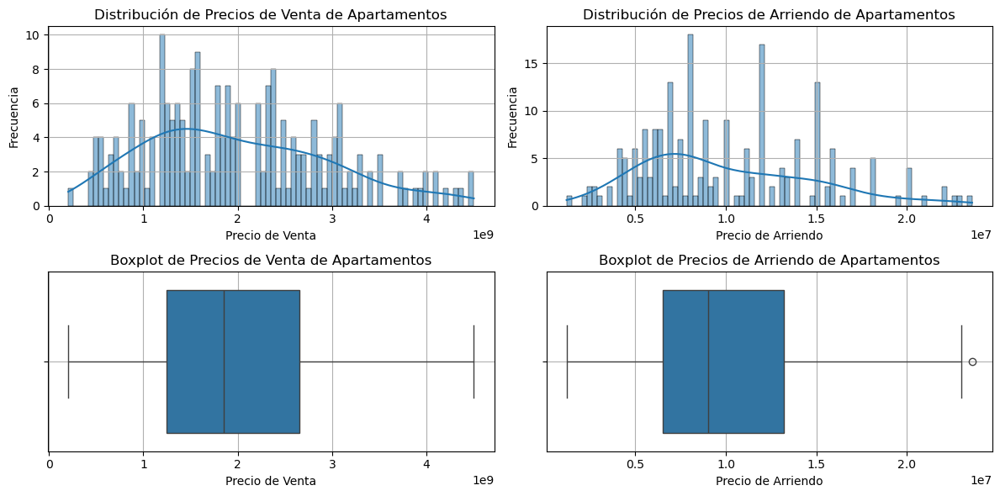

In [23]:
q1 = ambos_precios['precio_arriendo'].quantile(0.25)
q3 = ambos_precios['precio_arriendo'].quantile(0.75)
iqr = q3 - q1
lower_bound = q1 - 1.5 * iqr
upper_bound = q3 + 1.5 * iqr
ambos_precios = ambos_precios[(ambos_precios['precio_arriendo'] > lower_bound) & (ambos_precios['precio_arriendo'] < upper_bound)]

q1 = ambos_precios['precio_venta'].quantile(0.25)
q3 = ambos_precios['precio_venta'].quantile(0.75)
iqr = q3 - q1
lower_bound = q1 - 1.5 * iqr
upper_bound = q3 + 1.5 * iqr
ambos_precios = ambos_precios[(ambos_precios['precio_venta'] > lower_bound) & (ambos_precios['precio_venta'] < upper_bound)]

# Graficando uno al lado del otro (distribución y box) para validar que las distribuciones realmente son similares
fig, axs = plt.subplots(2, 2, figsize=(12, 6))

# Distribución de precios de venta
sns.histplot(ambos_precios['precio_venta'], bins=80, kde=True, ax=axs[0, 0])
axs[0, 0].set_title('Distribución de Precios de Venta de Apartamentos')
axs[0, 0].set_xlabel('Precio de Venta')
axs[0, 0].set_ylabel('Frecuencia')
axs[0, 0].grid(True)

# Distribución de precios de arriendo
sns.histplot(ambos_precios['precio_arriendo'], bins=80, kde=True, ax=axs[0, 1])
axs[0, 1].set_title('Distribución de Precios de Arriendo de Apartamentos')
axs[0, 1].set_xlabel('Precio de Arriendo')
axs[0, 1].set_ylabel('Frecuencia')
axs[0, 1].grid(True)

# Cajas de precios de venta
sns.boxplot(x=ambos_precios['precio_venta'], ax=axs[1, 0])
axs[1, 0].set_title('Boxplot de Precios de Venta de Apartamentos')
axs[1, 0].set_xlabel('Precio de Venta')
axs[1, 0].grid(True)

# Cajas de precios de arriendo
sns.boxplot(x=ambos_precios['precio_arriendo'], ax=axs[1, 1])
axs[1, 1].set_title('Boxplot de Precios de Arriendo de Apartamentos')
axs[1, 1].set_xlabel('Precio de Arriendo')
axs[1, 1].grid(True)

plt.tight_layout()
plt.show()

In [24]:
# Calculo de la correlación de Pearson (r)
pearson_correlation = ambos_precios['precio_venta'].corr(ambos_precios['precio_arriendo'], method='pearson')
print(f"Correlación de Pearson entre precio_venta y precio_arriendo: {pearson_correlation}")

# Validación de la Prueba de hipotesis
#   Hipótesis Nula (H0): No hay correlación entre las variables (es decir, r = 0)
#   Hipótesis Alternativa (Ha): Sí existe correlación (r <> 0)

# Calculo del estadistico t de student
t_statistic, p_value = stats.ttest_rel(ambos_precios['precio_venta'], ambos_precios['precio_arriendo'])
print(f"Estadístico t de Student: {t_statistic}")
print(f"Valor p: {p_value}")

# Calculo de los grados de libertad
df = len(ambos_precios) - 1
print(f"Grados de Libertad (df): {df}")

# Caculo de P
p = 1 - stats.t.cdf(t_statistic, df)
print(f"P-valor: {p}")

# Valudacion de la hipotesis
if p < 0.05:
    print("Se rechaza la hipótesis nula. Existe una correlación significativa entre las variables.")
else:
    print("No se rechaza la hipótesis nula. No existe una correlación significativa entre las variables.")


Correlación de Pearson entre precio_venta y precio_arriendo: 0.9398379708240756
Estadístico t de Student: 30.19195206230945
Valor p: 1.0276348919736833e-78
Grados de Libertad (df): 212
P-valor: 0.0
Se rechaza la hipótesis nula. Existe una correlación significativa entre las variables.


Debido a que la correlación enrte las variables es alta y significativa, construiremos una regresión lineal simple para imputar valores de venta a partir de los valores de arriendo.

--- Resultados de la Regresión Lineal ---
Coeficiente de Determinación (R²): 0.8833
Error Absoluto Medio (MAE): 242,693,349.69
Raíz del Error Cuadrático Medio (RMSE): 327,926,038.68

--- Coeficientes del Modelo ---
Intercepto (Venta Base): 64,017,557.57
Pendiente (Coeficiente por Arriendo): 192.136031


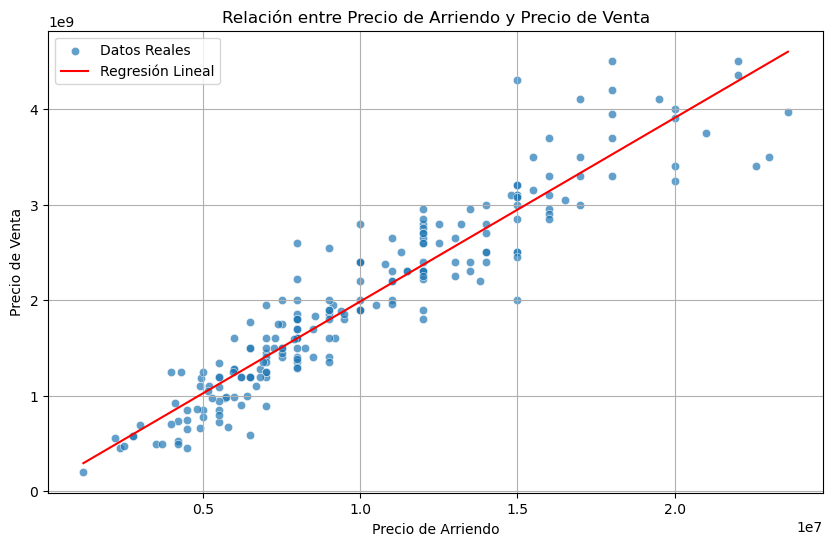

In [25]:
# Creación de regresión líneal simple para calcular precio de venta a partir del precio de arrendamiento.
X = ambos_precios[['precio_arriendo']]
y = ambos_precios['precio_venta']

x_train, x_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Usaremos todos los datos para este análisis inicial de correlación/regresión
x_train = X
y_train = y
x_test = X
y_test = y

# 3. Entrenar el modelo de Regresión Lineal
modelo_rl = LinearRegression()
modelo_rl.fit(x_train, y_train)

# 4. Hacer predicciones
y_pred = modelo_rl.predict(x_test)

# 5. Calcular Métricas de Precisión

# R-cuadrado (R^2)
r_squared = r2_score(y_test, y_pred)

# MAE (Mean Absolute Error)
mae = mean_absolute_error(y_test, y_pred)

# RMSE (Root Mean Squared Error)
rmse = np.sqrt(mean_squared_error(y_test, y_pred))

print(f"--- Resultados de la Regresión Lineal ---")
print(f"Coeficiente de Determinación (R²): {r_squared:.4f}")
print(f"Error Absoluto Medio (MAE): {mae:,.2f}")
print(f"Raíz del Error Cuadrático Medio (RMSE): {rmse:,.2f}")

# Coeficientes del modelo
intercept = modelo_rl.intercept_
coef = modelo_rl.coef_
print("\n--- Coeficientes del Modelo ---")
print(f"Intercepto (Venta Base): {modelo_rl.intercept_:,.2f}")
print(f"Pendiente (Coeficiente por Arriendo): {modelo_rl.coef_[0]:,.6f}")

plt.figure(figsize=(10, 6))
sns.scatterplot(x=x_test['precio_arriendo'], y=y_test, label='Datos Reales', alpha=0.7)
sns.lineplot(x=x_test['precio_arriendo'], y=y_pred, label='Regresión Lineal', color='red')
plt.title('Relación entre Precio de Arriendo y Precio de Venta')
plt.xlabel('Precio de Arriendo')
plt.ylabel('Precio de Venta')
plt.legend()
plt.grid(True)
plt.show()

# Imputación del valor de venta a partir del valor de arriendo.


El **error cuadratico medio** esta muy alto debido a la dispersión de los datos (visible en la grafica), sin embargo, la correlación de pearson (0.93) y el coeficiente de determinación (0.88) nos da la tranquilidad que la regresión será una muy buena herramienta de imputación, y la usaremos para el entrenamiento del modelo y según los resultados recibidos de los modelos resultantes, consideraremos remover los datos de los apartamentos en `ARRIENDO`

In [26]:
# Imputación de valor de venta usando valor de arriendo
# Para todos los apartamentos que estan en arriendo imputaremos el valor de venta desde el precio de arriendo

cantidad_imputados = 0
for index, row in apartamentos_df.iterrows():
    if row['tipo_operacion'] == 'ARRIENDO':
        precio_arriendo = row['precio_arriendo']
        valor_venta = intercept + (coef * precio_arriendo)
        apartamentos_df.at[index, 'precio_venta'] = valor_venta
        apartamentos_df.at[index, 'es_imp_arriendo'] = 1
        cantidad_imputados += 1
    else:
        apartamentos_df.at[index, 'es_imp_arriendo'] = 0

apartamentos_df['es_imp_arriendo'] = apartamentos_df['es_imp_arriendo'].astype(bool)
print(f"Cantidad de apartamentos en ARRIENDO que fueron imputados: {cantidad_imputados}")

Cantidad de apartamentos en ARRIENDO que fueron imputados: 15515


#### 1.1.2.5 Limpieza. de datos

In [27]:
print("="*50)

apartamentos_depurados_df = apartamentos_df[significant_numerical_vars + significant_categorical_vars + ['es_imp_arriendo', 'precio_venta']]

print(apartamentos_depurados_df.info())

nulos_df = pd.DataFrame({
    'Nulos': apartamentos_depurados_df.isnull().sum(),
    'Porcentaje (%)': (apartamentos_depurados_df.isnull().sum() / len(apartamentos_depurados_df) * 100).round(2)
})

print("\n[2] Conteo y Porcentaje de Valores Nulos por Columna:")

if nulos_df.empty:
    print("\n¡Felicidades! No se encontraron valores nulos en el dataset.")
else:
    print(nulos_df.sort_values(by='Nulos', ascending=False))

print(apartamentos_depurados_df['website'].unique())

print("\n" + "="*50)
print("Removiendo valores nulos posteriores a la imputación de datos")
print("="*50)

# Removiendo valores nulos
apartamentos_depurados_df = apartamentos_depurados_df.dropna()

# Removiendo valores extremos
q1 = apartamentos_depurados_df['precio_venta'].quantile(0.25)
q3 = apartamentos_depurados_df['precio_venta'].quantile(0.75)
iqr = q3 - q1
lower_bound = q1 - 1.5 * iqr
upper_bound = q3 + 1.5 * iqr

apartamentos_depurados_df = apartamentos_depurados_df[(apartamentos_depurados_df['precio_venta'] > lower_bound) & (apartamentos_depurados_df['precio_venta'] < upper_bound)]

print(apartamentos_depurados_df.info())

print("="*50)
print(f"Limite inferior: {lower_bound:,.2f}, Limite superior: {upper_bound:,.2f}")
print("="*50)

print("Análisis completado.")

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 43013 entries, 0 to 43012
Data columns (total 14 columns):
 #   Column           Non-Null Count  Dtype  
---  ------           --------------  -----  
 0   area             43013 non-null  float64
 1   habitaciones     43012 non-null  float64
 2   banos            43012 non-null  float64
 3   parqueaderos     43012 non-null  float64
 4   estrato          43012 non-null  float64
 5   longitud         43013 non-null  float64
 6   latitud          43013 non-null  float64
 7   tipo_propiedad   43013 non-null  object 
 8   sector           42943 non-null  object 
 9   website          43011 non-null  object 
 10  estado           43013 non-null  object 
 11  localidad        43013 non-null  object 
 12  es_imp_arriendo  43013 non-null  bool   
 13  precio_venta     43010 non-null  float64
dtypes: bool(1), float64(8), object(5)
memory usage: 4.3+ MB
None

[2] Conteo y Porcentaje de Valores Nulos por Columna:
                 Nulos  Porcentaje

## 1.2 Preparación de datos


### 1.2.1 Transformando variables categoricas

In [28]:
## Convirtiendo tipo_propiedad en variables binarias
#   Crearemos un valor binario de 1 o 0 para identificar si esta en conjunto cerrado
apartamentos_depurados_df['es_conjunto_cerrado'] = apartamentos_depurados_df['tipo_propiedad'].apply(lambda x: 1 if x == 'CASA CON CONJUNTO CERRADO' else 0)
apartamentos_depurados_df['es_conjunto_cerrado'] = apartamentos_depurados_df['es_conjunto_cerrado'].astype(bool)

#   Crearemos un valor binario de 1 o 0 para diferencias casas de apartamentos
apartamentos_depurados_df['es_apartamento'] = apartamentos_depurados_df['tipo_propiedad'].apply(lambda x: 1 if x == 'APARTAMENTO' else 0)
apartamentos_depurados_df['es_apartamento'] = apartamentos_depurados_df['es_apartamento'].astype(bool)

## Convirtiendo Website en binario
apartamentos_depurados_df['es_public_habi'] = apartamentos_depurados_df['website'].apply(lambda x: 1 if x == 'habi.co' else 0)
apartamentos_depurados_df['es_public_habi'] = apartamentos_depurados_df['es_public_habi'].astype(bool)

## Convirtiendo Estado en binario
apartamentos_depurados_df['es_nuevo'] = apartamentos_depurados_df['estado'].apply(lambda x: 1 if x == 'NUEVO' else 0)
apartamentos_depurados_df['es_nuevo'] = apartamentos_depurados_df['es_nuevo'].astype(bool)

print(apartamentos_depurados_df.info())


<class 'pandas.core.frame.DataFrame'>
Index: 39908 entries, 0 to 43012
Data columns (total 18 columns):
 #   Column               Non-Null Count  Dtype  
---  ------               --------------  -----  
 0   area                 39908 non-null  float64
 1   habitaciones         39908 non-null  float64
 2   banos                39908 non-null  float64
 3   parqueaderos         39908 non-null  float64
 4   estrato              39908 non-null  float64
 5   longitud             39908 non-null  float64
 6   latitud              39908 non-null  float64
 7   tipo_propiedad       39908 non-null  object 
 8   sector               39908 non-null  object 
 9   website              39908 non-null  object 
 10  estado               39908 non-null  object 
 11  localidad            39908 non-null  object 
 12  es_imp_arriendo      39908 non-null  bool   
 13  precio_venta         39908 non-null  float64
 14  es_conjunto_cerrado  39908 non-null  bool   
 15  es_apartamento       39908 non-null  bool

### 1.2.2 Definiendo variable ubicacion

Cantidad de sectores diferentes: 103
Cantidad de localidades diferentes: 19
sector
CHICO                   8793
SANTA BARBARA           6975
COUNTRY                 3223
COLINA Y ALREDEDORES    2950
CEDRITOS                2544
                        ... 
CORABASTOS                 1
TEUSAQUILLO                1
SAN FRANCISCO              1
SAN RAFAEL                 1
DOCE DE OCTUBRE            1
Name: count, Length: 103, dtype: int64
localidad
USAQUEN               14128
CHAPINERO             10796
SUBA                   6737
FONTIBON               1636
KENNEDY                1308
ENGATIVA               1233
TEUSAQUILLO            1142
SANTA FE                669
BOSA                    415
PUENTE ARANDA           325
BARRIOS UNIDOS          312
LOS MARTIRES            295
CIUDAD BOLIVAR          294
RAFAEL URIBE URIBE      182
ANTONIO NARINO          105
CANDELARIA               98
SAN CRISTOBAL            94
USME                     87
TUNJUELITO               52
Name: count, dtyp

Text(0.5, 0, 'Cantidad de Registros')

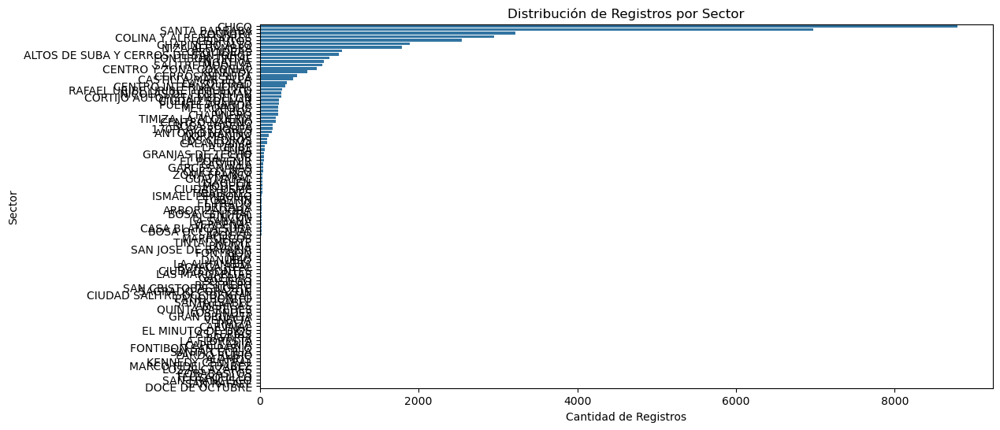

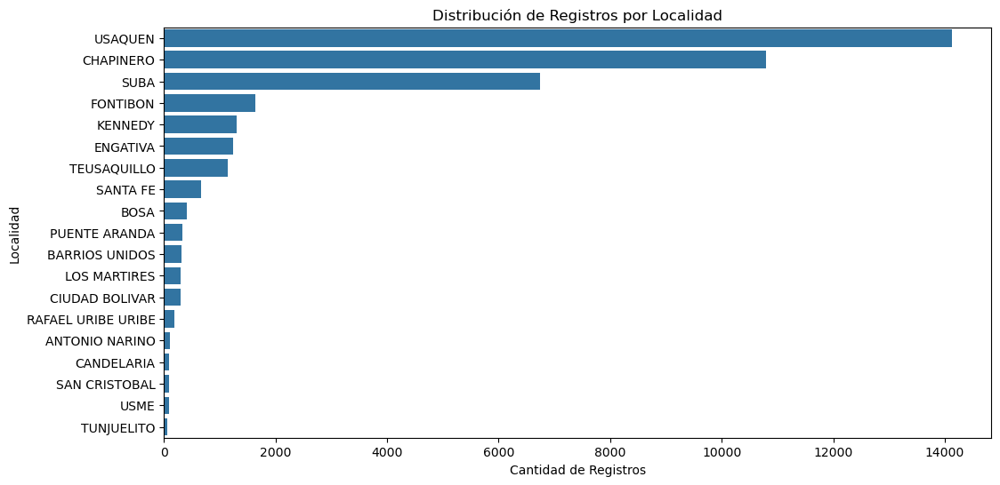

In [29]:
print(f"Cantidad de sectores diferentes: {len(apartamentos_depurados_df['sector'].unique())}")
print(f"Cantidad de localidades diferentes: {len(apartamentos_depurados_df['localidad'].unique())}")

# Enfocaremos el analisis en Sector, revisando la distribución de registros por sector
sector_counts = apartamentos_depurados_df['sector'].value_counts()
print(sector_counts)

# Graficaremos la distribución de registros por sector para entender con mayor detalle
plt.figure(figsize=(12, 6))
sns.barplot(y=sector_counts.index, x=sector_counts.values)
plt.title('Distribución de Registros por Sector')
plt.ylabel('Sector')
plt.xlabel('Cantidad de Registros')

localidad_counts = apartamentos_depurados_df['localidad'].value_counts()
print(localidad_counts)

plt.figure(figsize=(12, 6))
sns.barplot(y=localidad_counts.index, x=localidad_counts.values)
plt.title('Distribución de Registros por Localidad')
plt.ylabel('Localidad')
plt.xlabel('Cantidad de Registros')


Existen muchos sectores con muy pocos datos, entonces definiremos una nueva variable `ubicacion` que nos permitira agrupar de mejor manera los datos.

Calcularemos el número de preferido de datos por sector:

limite = total_registros / total_sectores

Usaremos ese límite para identificar cuando vale la pena segmentar la localidad en sectores, es decir si la localidad tiene menos registros que ese limite mantendremos la localidad, si tiene más, la distribuiremos en sectores.

Total de sectores: 103
Total de registros: 39908
Límite de registros por localidad: 387.45631067961165
ubicacion
CHAPINERO - CHICO             8793
USAQUEN - SANTA BARBARA       6975
SANTA FE - Otros              5291
USAQUEN - COUNTRY             3223
USAQUEN - CEDRITOS            2544
ENGATIVA - Otros              2493
TEUSAQUILLO - Otros           2225
CHAPINERO - CHAPINERO ALTO    1894
SUBA - NIZA ALHAMBRA          1791
BOSA - Otros                  1308
SUBA - CERROS DE SUBA          475
SUBA - Otros                   422
PUENTE ARANDA - Otros          325
BARRIOS UNIDOS - Otros         312
LOS MARTIRES - Otros           295
CIUDAD BOLIVAR - Otros         294
USAQUEN - Otros                253
KENNEDY - Otros                188
RAFAEL URIBE URIBE - Otros     182
FONTIBON - Otros               147
ANTONIO NARINO - Otros         105
CANDELARIA - Otros              98
SAN CRISTOBAL - Otros           94
USME - Otros                    87
TUNJUELITO - Otros              52
CHAPINERO - 

Text(0.5, 0, 'Cantidad de Registros')

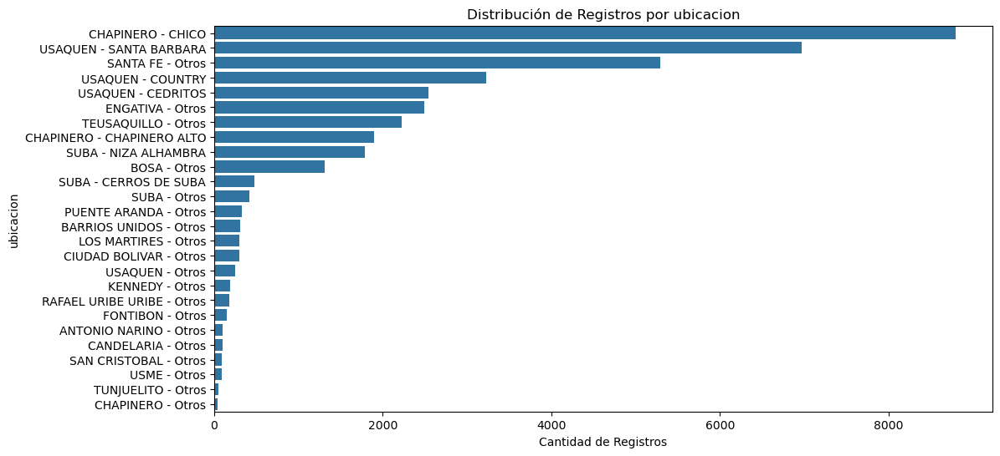

In [30]:
temp_total_sectores = len(apartamentos_depurados_df['sector'].unique())
temp_total_registros = len(apartamentos_depurados_df)
temp_ubicacion_limite = temp_total_registros / temp_total_sectores

print(f"Total de sectores: {temp_total_sectores}")
print(f"Total de registros: {temp_total_registros}")
print(f"Límite de registros por localidad: {temp_ubicacion_limite}")

for localidad in localidad_counts.index:
   if localidad_counts[localidad] < temp_ubicacion_limite:
       # print(f"Localidad: {localidad}, Registros: {localidad_counts[localidad]}")
       apartamentos_depurados_df.loc[apartamentos_depurados_df['localidad'] == localidad, 'ubicacion'] = localidad + " - Otros"
   else:
       temp_sectores_x_localidad = apartamentos_depurados_df[apartamentos_depurados_df['localidad'] == localidad]['sector'].value_counts()
       for sector in temp_sectores_x_localidad.index:
           if temp_sectores_x_localidad[sector] < temp_ubicacion_limite:
               # print(f"Localidad: {localidad}, Sector {sector} Registros: {temp_sectores_x_localidad[sector]} Clasificacion: Otros")
               apartamentos_depurados_df.loc[apartamentos_depurados_df['sector'] == sector, 'ubicacion'] = localidad + " - " + "Otros"
           else:
               # print(f"Localidad: {localidad}, Sector {sector} Registros: {temp_sectores_x_localidad[sector]} Clasificacion: {sector}")
               apartamentos_depurados_df.loc[apartamentos_depurados_df['sector'] == sector, 'ubicacion'] = localidad + " - " + sector

# Imprimir la variable ubicación por orden alfabetico con el total de registros por cada uno
ubicacion_counts = apartamentos_depurados_df['ubicacion'].value_counts()

print("="*30)
print(ubicacion_counts)
print("="*30)

plt.figure(figsize=(12, 6))
sns.barplot(y=ubicacion_counts.index, x=ubicacion_counts.values)
plt.title('Distribución de Registros por ubicacion')
plt.ylabel('ubicacion')
plt.xlabel('Cantidad de Registros')


Por pruebas ejecutadas con esta distribución hemos encontrado que las concentración de datos no es todavía suficientemente homogenea en cantidad de datos, así, que cambiaremos el enfoque, usaremos las variables latitud y longitud para construir clusters de datos basados en la ubicación geografica.

ubicacion
23    3312
11    3152
24    2925
26    2897
2     2797
15    2275
19    2158
8     2132
0     1987
17    1844
22    1523
6     1437
12    1265
10    1199
3      915
5      852
7      852
9      764
21     756
13     634
20     634
27     529
28     496
4      474
16     459
14     418
1      393
29     383
25     359
18      87
Name: count, dtype: int64


Text(0, 0.5, 'Cantidad de Registros')

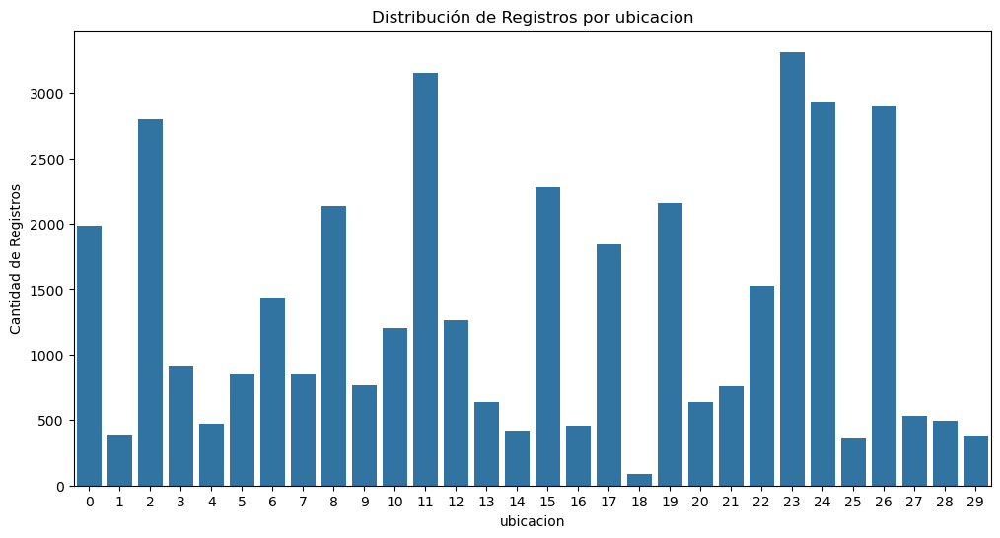

In [31]:
# 1. Configuración del Clustering
# En lugar de usar los 419 barrios, o los 109 Sectores, vamos a usar KMeans, para que genere
# 30 "zonas naturales"
k_zonas = 30

kmeans = KMeans(n_clusters=k_zonas, random_state=42)

# 2. Crear los clusters
# Solo usamos las coordenadas para esto.
apartamentos_depurados_df['ubicacion'] = kmeans.fit_predict(apartamentos_depurados_df[['latitud', 'longitud']])

# Ahora 'cluster_ubicacion' es la nueva variable categórica (valores del 0 al 29)
# Usaremos esta ubicación en lugar de Sector
ubicacion_counts = apartamentos_depurados_df['ubicacion'].value_counts()

print("="*30)
print(ubicacion_counts)
print("="*30)

plt.figure(figsize=(12, 6))
sns.barplot(x=ubicacion_counts.index, y=ubicacion_counts.values)
plt.title('Distribución de Registros por ubicacion')
plt.xlabel('ubicacion')
plt.ylabel('Cantidad de Registros')


La distribución de los datos es mucho más homogenea que la que logramos con sector, y la cercanía geografica nos permite relacionar datos de diferentes zonas geograficas naturales, lo cual no logramos solo con el nombre del sector o localidad.

### 1.2.3 Aplicando el modelo de One-Hot Encoding sobre la variable ubicación

In [32]:
# Generando nuevas variables usando la estrategia One-Hot Encoding basado en la variable ubicación
ubicacion_dummies = pd.get_dummies(apartamentos_depurados_df['ubicacion'], prefix='ubicacion')
apartamentos_depurados_df = pd.concat([apartamentos_depurados_df, ubicacion_dummies], axis=1)

print(apartamentos_depurados_df.info())
print(apartamentos_depurados_df.head())

<class 'pandas.core.frame.DataFrame'>
Index: 39908 entries, 0 to 43012
Data columns (total 49 columns):
 #   Column               Non-Null Count  Dtype  
---  ------               --------------  -----  
 0   area                 39908 non-null  float64
 1   habitaciones         39908 non-null  float64
 2   banos                39908 non-null  float64
 3   parqueaderos         39908 non-null  float64
 4   estrato              39908 non-null  float64
 5   longitud             39908 non-null  float64
 6   latitud              39908 non-null  float64
 7   tipo_propiedad       39908 non-null  object 
 8   sector               39908 non-null  object 
 9   website              39908 non-null  object 
 10  estado               39908 non-null  object 
 11  localidad            39908 non-null  object 
 12  es_imp_arriendo      39908 non-null  bool   
 13  precio_venta         39908 non-null  float64
 14  es_conjunto_cerrado  39908 non-null  bool   
 15  es_apartamento       39908 non-null  bool

## 1.3 Conclusiones del entendimiento, imputación, limpieza y preparación de datos.

**Descripción del dataset**

El dataset está compuesto por 43013 registros con 46 columnas. El dataset tiene gran catidad de registros con datos nulos, de los cuales lo más relevantes es que se encuetran 3 grandes grupos.
Apartamentos para arrendar
Apartamentos para vender
Y Apartamentos para venta y arriendo. Adicionalmente, hay varias columnas que describen el inmueble y tienen muchos datos incompletos.

---
**Acciones importantes**

Acorde a los objetivos definidos para el proyecto, establecimos que la variable `precio_venta` será el valor clave, que debemos predecir.
Se seleccionaron un listado de variables relevantes para simplificar el desarrollo usando correlación con `precio_venta` para variables cuantitativas, y pruebas de hipotesis entre `precio_venta` y las variables categoricas para identificar un listado de variables relevantes y definir su prioridad.

Con el resultado de este analisis se seleccionaron las siguientes columnas:

     Cuantitativas
     *    area            
     *    habitaciones    
     *    banos           
     *    parqueaderos    
     *    estrato         
     *    longitud
     *    latitud        
     Categoricas
     *    tipo_propiedad   
     *    antiguedad
     *    sector           
     *    website          
     *    estado           
     *    localidad        


---
**Imputación de datos**

Posteriormente entre estas variables relevantes, se hizo un análisis detallado para manejo de nulos y valores extremos y se hizo imputación de datos con diferentes estrategias:

*   **Sector** fue imputado a partir de **barrio**
*   **Estado** fue imputado a partir de **antiguedad**

*Nota:* Al **antiguedad** tener un nivel de significancia de `0.518` que es mucho menor a **estado** que tiene `0.809` y proveer información muy similar se descartará **antiguedad**

Adicionalmente, se diseño una *regresión líneal* usando los registros que se encuantran en `venta y arriendo`, que nos genero un predictor de precio de venta desde precio de arriendo y se imputo el **precio de venta** en el dataset con los apartamentos que estan en **arriendo**.

> Este estimador demostró un gran nivel de correlación basado en el indicador de Pearson, sin embargo, tiene un RMSE muy alto, razón por la cúal se dejaran marcados los registros imputados para poder descartarlos en caso de que presenten malos resulatados en los modelos que se desarrollaran.

---
**Limpieza**

Se eliminaron los datos nulos que no pudieron ser imputados de las variables relevantes, dejando un dataset resultante con **42936** registros y 12 columnas.


---
**Preparación**

Se convirtieron las variables categoricas (tipo_propiedad, website, estado) en variables númericas (0 ó 1).

Adicionalmente se generarón agrupaciones de los campos `Localidad` y `Sector`con el fin de mejorar la distribución de los datos, hasta que se lograron 26 ubicaciones con 42 registros en la ubicación menos poblada.

Lamentablemente, después de varias ejecuciones, decidimos cambiar la estrategia de definción de ubicación para lo cual usamos Kmeans usando las variables `latitud` y `longitud` construimos 30 grupos por cercania

Finalmente, se uso la estrategía `One-Hot Encoding` para codificar las 26 clases de ubicación que resultaron del anterior procesamiento.


In [33]:
# Exportación del dataframe y guardado en el drive
apartamentos_depurados_df.to_csv('apartamentos_depurados.csv', index=False)
#ruta_depurado = '/content/drive/My Drive/Taller2/apartamentos_depurados.csv'
#apartamentos_depurados_df.to_csv(ruta_depurado, index=False)

#drive.flush_and_unmount()

# 2 Entrenamiento del modelo de Machine Learning

In [36]:
#drive.mount('/content/drive')

# Ruta al archivo (ajusta NOMBRE_DE_TU_CARPETA y el archivo CSV)
#ruta = '/content/drive/My Drive/Taller2/apartamentos_depurados.csv'

# Leer el CSV
apartamentos_depurados_df = pd.read_csv('apartamentos_depurados.csv')

## 2.1 Linear Regressor

In [37]:
import pandas as pd
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LinearRegression
from sklearn.metrics import r2_score, mean_absolute_error, mean_squared_error
import numpy as np

# Identify numerical and boolean columns for features
numerical_cols = apartamentos_depurados_df.select_dtypes(include=['float64', 'int64']).columns.tolist()
boolean_cols = apartamentos_depurados_df.select_dtypes(include=['bool']).columns.tolist()

# Exclude 'precio_venta' from features
if 'precio_venta' in numerical_cols:
    numerical_cols.remove('precio_venta')
numerical_cols.remove('ubicacion')

# Combine all feature columns
features = numerical_cols + boolean_cols

# Inicialmente entrenaremos el modelo unicamente con los valores NO imputados de precio de venta
X = apartamentos_depurados_df[apartamentos_depurados_df['es_imp_arriendo'] == 0][features]
y = apartamentos_depurados_df[apartamentos_depurados_df['es_imp_arriendo'] == 0]['precio_venta']

# Split data into training (70%), validation (15%), and test (15%)
X_train, X_temp, y_train, y_temp = train_test_split(X, y, test_size=0.3, random_state=42)
X_val, X_test, y_val, y_test = train_test_split(X_temp, y_temp, test_size=0.5, random_state=42)

print(f"Tamaño del set de entrenamiento: {X_train.shape[0]} muestras")
print(f"Tamaño del set de validación: {X_val.shape[0]} muestras")
print(f"Tamaño del set de prueba: {X_test.shape[0]} muestras")

# Initialize and train the Linear Regression model
rl_model = LinearRegression()
rl_model.fit(X_train, y_train)

# Make predictions on the test set
y_pred = rl_model.predict(X_test)

# Evaluate the model
r_squared = r2_score(y_test, y_pred)
mae = mean_absolute_error(y_test, y_pred)
rmse = np.sqrt(mean_squared_error(y_test, y_pred))

print("\n--- Evaluación del Modelo de Regresión Lineal ---")
print(f"Coeficiente de Determinación (R²): {r_squared:.4f}")
print(f"Error Absoluto Medio (MAE): {mae:,.2f}")
print(f"Raíz del Error Cuadrático Medio (RMSE): {rmse:,.2f}")

Tamaño del set de entrenamiento: 17982 muestras
Tamaño del set de validación: 3853 muestras
Tamaño del set de prueba: 3854 muestras

--- Evaluación del Modelo de Regresión Lineal ---
Coeficiente de Determinación (R²): 0.7188
Error Absoluto Medio (MAE): 218,323,300.94
Raíz del Error Cuadrático Medio (RMSE): 323,069,820.77


Los resultados de la regresión líneal no son satisfactorios agregaremos los datos de precio de venta imputados a partir del valor del arriendo y verificaremos nuevamente la metricas.

In [38]:
# Inicialmente entrenaremos el modelo unicamente con los valores NO imputados de precio de venta
X = apartamentos_depurados_df[apartamentos_depurados_df['es_imp_arriendo'] == 0][features]
y = apartamentos_depurados_df[apartamentos_depurados_df['es_imp_arriendo'] == 0]['precio_venta']

# Split data into training (70%), validation (15%), and test (15%)
X_train, X_temp, y_train, y_temp = train_test_split(X, y, test_size=0.3, random_state=42)
X_val, X_test, y_val, y_test = train_test_split(X_temp, y_temp, test_size=0.5, random_state=42)

# aregaremos a los datos de entrenamiento los valores imputados y volveremos a validar las metricas de la regresión
X_train = pd.concat([X_train, apartamentos_depurados_df[apartamentos_depurados_df['es_imp_arriendo'] == 1][features]])
y_train = pd.concat([y_train, apartamentos_depurados_df[apartamentos_depurados_df['es_imp_arriendo'] == 1]['precio_venta']])

print(f"Tamaño del set de entrenamiento: {X_train.shape[0]} muestras")
print(f"Tamaño del set de validación: {X_val.shape[0]} muestras")
print(f"Tamaño del set de prueba: {X_test.shape[0]} muestras")

# Initialize and train the Linear Regression model
rl_model_temp = LinearRegression()
rl_model_temp.fit(X_train, y_train)

# Make predictions on the test set
y_pred = rl_model_temp.predict(X_test)

# Evaluate the model
r_squared = r2_score(y_test, y_pred)
mae = mean_absolute_error(y_test, y_pred)
rmse = np.sqrt(mean_squared_error(y_test, y_pred))

print("\n--- Evaluación del Modelo de Regresión Lineal ---")
print(f"Coeficiente de Determinación (R²): {r_squared:.4f}")
print(f"Error Absoluto Medio (MAE): {mae:,.2f}")
print(f"Raíz del Error Cuadrático Medio (RMSE): {rmse:,.2f}")

Tamaño del set de entrenamiento: 32201 muestras
Tamaño del set de validación: 3853 muestras
Tamaño del set de prueba: 3854 muestras

--- Evaluación del Modelo de Regresión Lineal ---
Coeficiente de Determinación (R²): 0.7164
Error Absoluto Medio (MAE): 221,465,292.29
Raíz del Error Cuadrático Medio (RMSE): 324,428,964.71


Encontramos 2 conclusiones de este analisis:
1. La regresión líneal predice de manera correcta el precio de venta en el 71% de los casos, sin embargo, las desviaciones del MAE siguen siendo muy altas para lo esperadas por el negocio.
2. Los datos imputados no modifican de manera significativa el modelo, lo que nos da la confianza de poder seguir usando estos datos en los entrenamientos siguientes.

Mantendremos el modelo de regresión líneal, para futuras evaluaciones: `rl_model`

## 2.2 Decision Tree Regressor

In [39]:
from sklearn.tree import DecisionTreeRegressor
from sklearn.ensemble import RandomForestRegressor, GradientBoostingRegressor

# --- Decision Tree Regressor ---
print("\n--- Decision Tree Regressor ---")
dtr_model = DecisionTreeRegressor(random_state=42)
dtr_model.fit(X_train, y_train)
y_pred_dtr = dtr_model.predict(X_val)

r_squared_dtr = r2_score(y_val, y_pred_dtr)
mae_dtr = mean_absolute_error(y_val, y_pred_dtr)
rmse_dtr = np.sqrt(mean_squared_error(y_val, y_pred_dtr))

print(f"R²: {r_squared_dtr:.4f}")
print(f"MAE: {mae_dtr:,.2f}")
print(f"RMSE: {rmse_dtr:,.2f}")


--- Decision Tree Regressor ---
R²: 0.7607
MAE: 157,236,123.79
RMSE: 297,986,030.37


La Decision Tree Regressor tiene un comportamiento similar a la regresión lineal, pero, buscaremos otros modelos en busca de un mejor desempeño.

Mantendremos el modelo, para futuras evaluaciones: `dtr_model`

## 2.3 Random Forest Regressor

In [41]:
from sklearn.tree import DecisionTreeRegressor
from sklearn.ensemble import RandomForestRegressor, GradientBoostingRegressor

# --- Random Forest Regressor ---
print("\n--- Random Forest Regressor ---")
rfr_model = RandomForestRegressor(random_state=42, n_estimators=100, n_jobs=-1)
rfr_model.fit(X_train, y_train)
y_pred_rfr = rfr_model.predict(X_val)

r_squared_rfr = r2_score(y_val, y_pred_rfr)
mae_rfr = mean_absolute_error(y_val, y_pred_rfr)
rmse_rfr = np.sqrt(mean_squared_error(y_val, y_pred_rfr))

print(f"R²: {r_squared_rfr:.4f}")
print(f"MAE: {mae_rfr:,.2f}")
print(f"RMSE: {rmse_rfr:,.2f}")


--- Random Forest Regressor ---
R²: 0.8810
MAE: 119,777,386.91
RMSE: 210,140,268.66


La Decision Tree Regressor tiene un mejor comportamiento que la regresión lineal y el decision tree, pero, buscaremos otros modelos en busca de un mejor desempeño.

Mantendremos el modelo, para futuras evaluaciones: `rfr_model`

## 2.4 Gradient Boosting Regressor

In [42]:
# --- Gradient Boosting Regressor ---
print("\n--- Gradient Boosting Regressor ---")
gbr_model = GradientBoostingRegressor(random_state=42, n_estimators=100, learning_rate=0.1)
gbr_model.fit(X_train, y_train)
y_pred_gbr = gbr_model.predict(X_val)

r_squared_gbr = r2_score(y_val, y_pred_gbr)
mae_gbr = mean_absolute_error(y_val, y_pred_gbr)
rmse_gbr = np.sqrt(mean_squared_error(y_val, y_pred_gbr))

print(f"R²: {r_squared_gbr:.4f}")
print(f"MAE: {mae_gbr:,.2f}")
print(f"RMSE: {rmse_gbr:,.2f}")


--- Gradient Boosting Regressor ---
R²: 0.8512
MAE: 148,040,155.54
RMSE: 235,009,475.47


La Gradient Boosting Regressor tiene un comportamiento similar a la regresión lineal, pero, buscaremos otros modelos en busca de un mejor desempeño.

Mantendremos el modelo, para futuras evaluaciones: `gbr_model`

## 2.5 Selección del modelo

In [43]:
# tabla comparativa de los R2, MAE y RMSE, de los modelos Linear Regressor, Decision Tree Rergessor, Random Forest Regressor, Gradient Boosting Regressor
print("\n--- Comparación de Modelos ---")
print(f"Linear Regressor: R²={r_squared:.4f}, MAE={mae:,.2f}, RMSE={rmse:,.2f}")
print(f"Decision Tree Regressor: R²={r_squared_dtr:.4f}, MAE={mae_dtr:,.2f}, RMSE={rmse_dtr:,.2f}")
print(f"Random Forest Regressor: R²={r_squared_rfr:.4f}, MAE={mae_rfr:,.2f}, RMSE={rmse_rfr:,.2f}")
print(f"Gradient Boosting Regressor: R²={r_squared_gbr:.4f}, MAE={mae_gbr:,.2f}, RMSE={rmse_gbr:,.2f}")



--- Comparación de Modelos ---
Linear Regressor: R²=0.7164, MAE=221,465,292.29, RMSE=324,428,964.71
Decision Tree Regressor: R²=0.7607, MAE=157,236,123.79, RMSE=297,986,030.37
Random Forest Regressor: R²=0.8810, MAE=119,777,386.91, RMSE=210,140,268.66
Gradient Boosting Regressor: R²=0.8512, MAE=148,040,155.54, RMSE=235,009,475.47


A partir de los resultados anteriores seleccionamos el **Random Forest Regressor**: R²=0.8810, MAE=119,777,386.91, RMSE=210,140,268.66

In [44]:
# --- Random Forest Regressor ---
y_test_pred_selected = rfr_model.predict(X_test)
r_squared_selected = r2_score(y_test, y_test_pred_selected)
mae_selected = mean_absolute_error(y_test, y_test_pred_selected)
rmse_selected = np.sqrt(mean_squared_error(y_test, y_test_pred_selected))

print(f"R²: {r_squared_selected:.4f}")
print(f"MAE: {mae_selected:,.2f}")
print(f"RMSE: {rmse_selected:,.2f}")

R²: 0.8911
MAE: 114,942,708.94
RMSE: 201,059,317.68


# 3 Análisis cuantitativo de resultados del modelo

El modelo desarrollado presenta un desempeño estadístico robusto con un coeficiente de determinación ($R^2$) de 0.8911, lo que indica que nuestra solución logra explicar el 89.11% de la variabilidad en los precios de los apartamentos basándose en las características y ubicación suministradas. Esto genera un alto valor para *HabitAlpes*, pues valida que la herramienta captura correctamente las dinámicas generales del mercado inmobiliario.

Sin embargo, en términos de precisión operativa, el modelo arroja un Error Absoluto Medio (MAE) de \$114,942,708, lo que significa que, en promedio, nuestras predicciones se desvían en este monto respecto al valor real. Si bien el $R^2$ es alto, un MAE de esta magnitud representa un riesgo para la meta de automatización, dado que el negocio establece que subestimaciones superiores a 20 millones detonan una solicitud de avalúo presencial.

Adicionalmente, la diferencia notable entre el MAE y la Raíz del Error Cuadrático Medio (RMSE) de \$201,059,317 sugiere la presencia de errores atípicos (outliers) significativos que están penalizando el modelo.

**Justificación y Oportunidades de Mejora:** La calidad del modelo es alta en cuanto a tendencia general ($R^2$), impulsada positivamente por la riqueza de los datos históricos recolectados. No obstante, para maximizar la reducción de tiempo del perito de 6 horas a 1 hora, es imperativo reducir la dispersión del error. Como oportunidad de mejora, se sugiere una segmentación del modelo por rangos de precios o zonas (para evitar que propiedades de lujo distorsionen el error en viviendas de menor valor) y una revisión de la ingeniería de características para manejar mejor la alta cardinalidad de los barrios, lo cual ayudaría a disminuir tanto el MAE como la sensibilidad a valores atípicos reflejada en el RMSE.

# 4 Análisis cualitativo de resultados del modelo

## 4.1 Valores SHAPLEY para revisar como se esta comportando el modelo

/opt/anaconda3/envs/jupyter/lib/python3.11/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


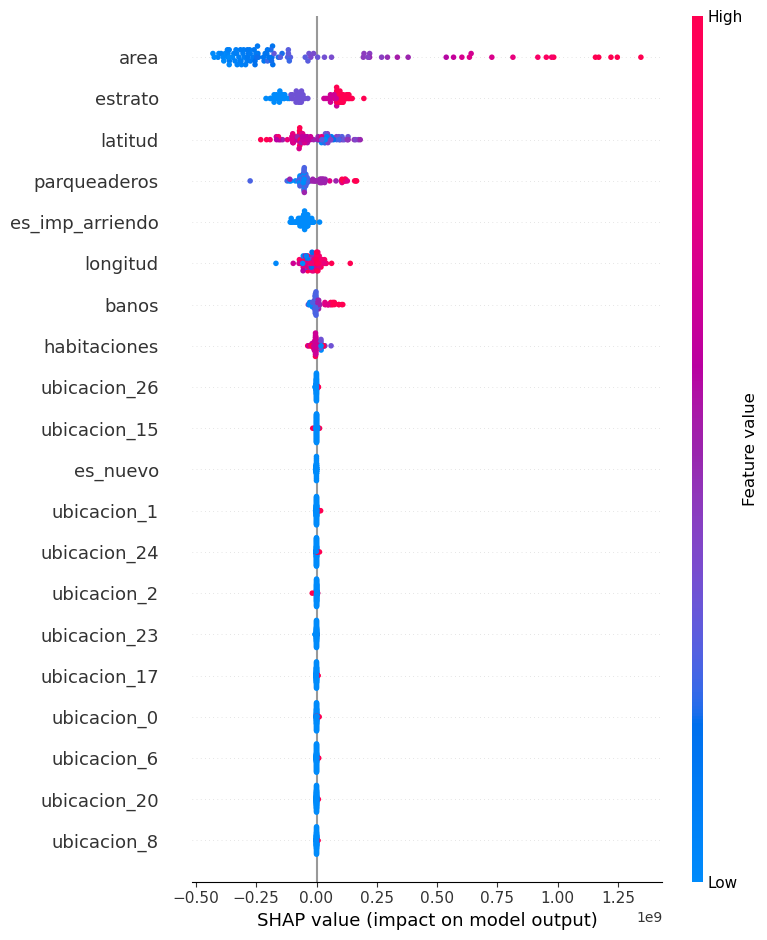

In [45]:
import shap
import numpy as np
import pandas as pd # Ensure pandas is imported
shap.initjs()


# Create a copy of X_test for SHAP analysis to avoid modifying the original and potential side effects
X_test_for_shap = X_test.copy()

# Convertir las columnas booleanas de X_test_for_shap a enteros
for col in X_test_for_shap.select_dtypes(include='bool').columns:
    X_test_for_shap[col] = X_test_for_shap[col].astype(int)

# Tomar una muestra aleatoria de X_test para la explicación SHAP para evitar problemas de memoria
# Se recomienda usar un número pequeño (ej. 100, 500) para visualizaciones.
sample_size = 100
X_test_sample = X_test_for_shap.sample(n=__builtins__.min(sample_size, len(X_test_for_shap)), random_state=42)

# Crear un explainer usando el modelo seleccionado y los datos de la muestra
# Para modelos basados en árboles como RandomForest, TreeExplainer es eficiente.
explainer = shap.TreeExplainer(rfr_model)

# Calcular los valores SHAP para la muestra
shap_values = explainer.shap_values(X_test_sample)

# Visualizar la importancia de las características (ejemplo: summary plot)
shap.summary_plot(shap_values, X_test_sample)

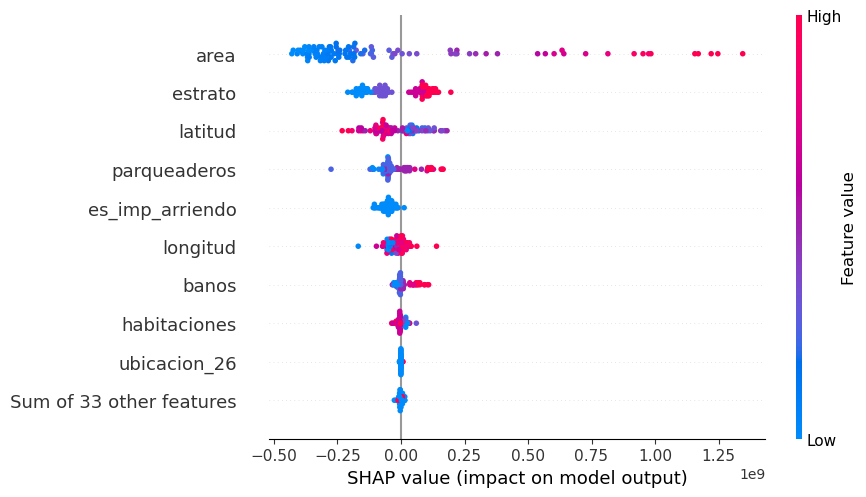

In [46]:
shap.plots.beeswarm(shap.Explanation(shap_values, explainer.expected_value, X_test_sample))

In [47]:
shap.initjs()
shap.force_plot(explainer.expected_value, shap_values, X_test_sample)

Valor de la etiqueta en el dataset: 260000000.0
Valor predecido por el modelo: 303105000.0


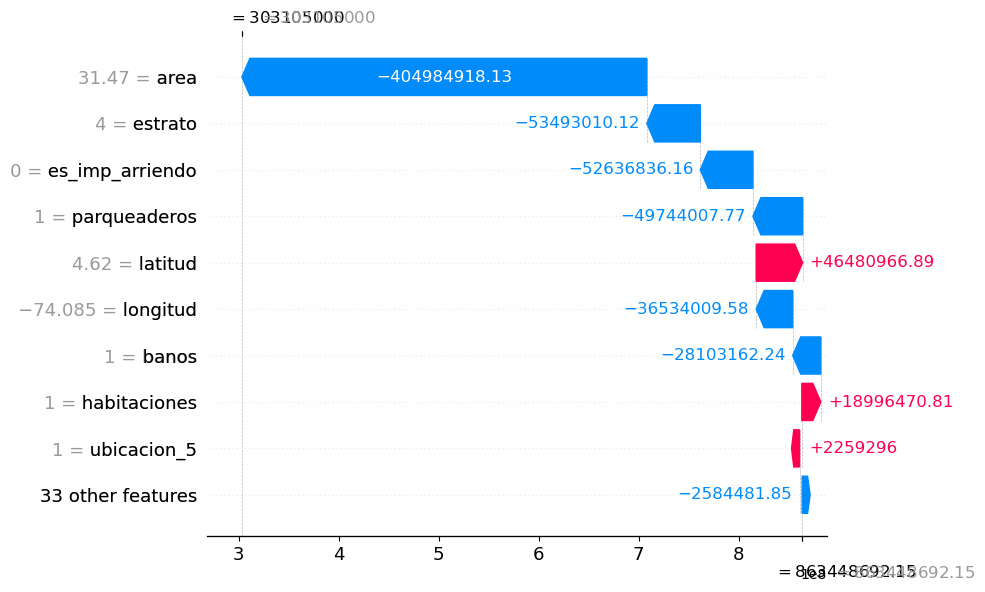

In [48]:
sample_index = 40
print("Valor de la etiqueta en el dataset:" ,y_test.loc[X_test_sample.index[sample_index]])
print("Valor predecido por el modelo:", rfr_model.predict(X_test_sample.iloc[[sample_index]])[0])

# Crear un objeto Explanation para la muestra específica para el waterfall plot
shap_explanation_for_sample = shap.Explanation(
    values=shap_values[sample_index,:],
    base_values=explainer.expected_value,
    data=X_test_sample.iloc[sample_index,:],
    feature_names=X_test_sample.columns
)

shap.plots.waterfall(shap_explanation_for_sample)

Valor de la etiqueta en el dataset: 720000000.0
Valor predecido por el modelo: 762123785.91


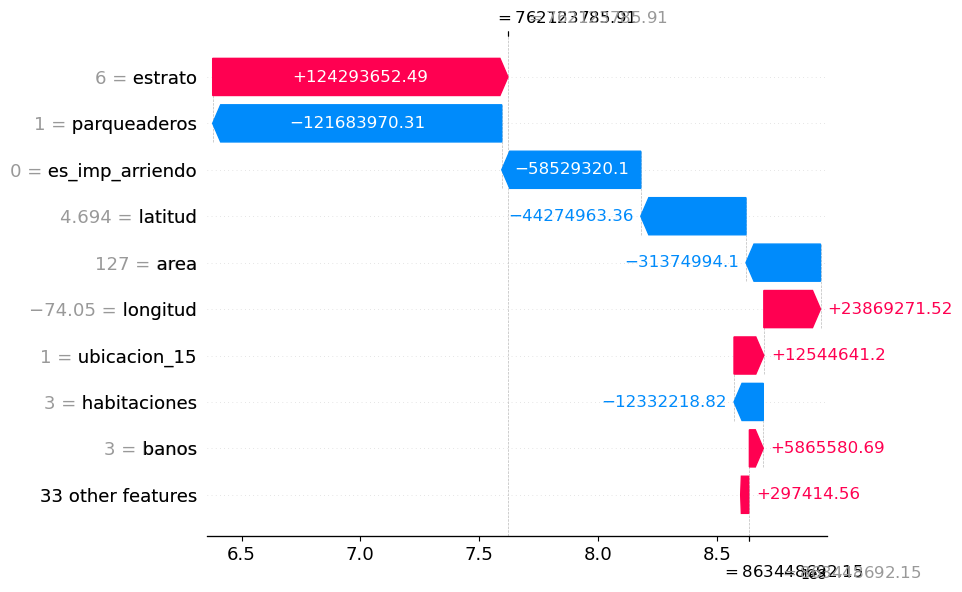

In [49]:
sample_index = 95
print("Valor de la etiqueta en el dataset:" ,y_test.loc[X_test_sample.index[sample_index]])
print("Valor predecido por el modelo:", rfr_model.predict(X_test_sample.iloc[[sample_index]])[0])

# Crear un objeto Explanation para la muestra específica para el waterfall plot
shap_explanation_for_sample = shap.Explanation(
    values=shap_values[sample_index,:],
    base_values=explainer.expected_value,
    data=X_test_sample.iloc[sample_index,:],
    feature_names=X_test_sample.columns
)

shap.plots.waterfall(shap_explanation_for_sample)

Valor de la etiqueta en el dataset: 216000000.0
Valor predecido por el modelo: 218095000.0


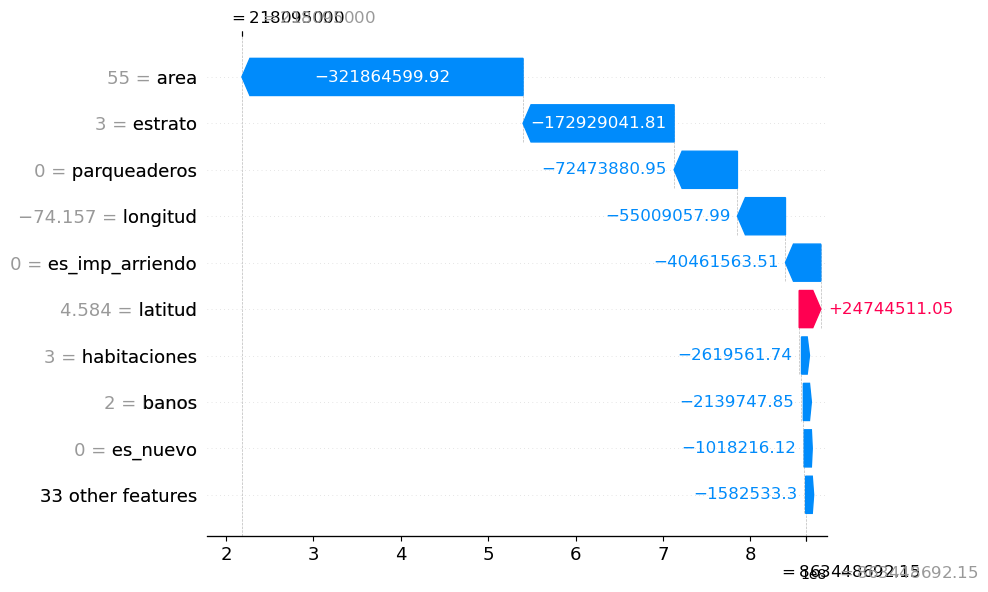

In [50]:
sample_index = 10
print("Valor de la etiqueta en el dataset:" ,y_test.loc[X_test_sample.index[sample_index]])
print("Valor predecido por el modelo:", rfr_model.predict(X_test_sample.iloc[[sample_index]])[0])

# Crear un objeto Explanation para la muestra específica para el waterfall plot
shap_explanation_for_sample = shap.Explanation(
    values=shap_values[sample_index,:],
    base_values=explainer.expected_value,
    data=X_test_sample.iloc[sample_index,:],
    feature_names=X_test_sample.columns
)

shap.plots.waterfall(shap_explanation_for_sample)

Valor de la etiqueta en el dataset: 520000000.0
Valor predecido por el modelo: 776102000.0


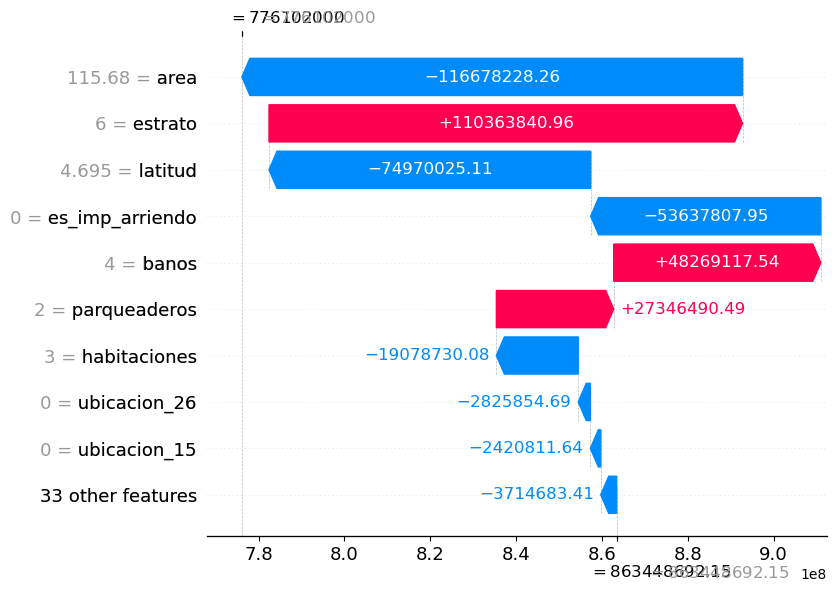

In [51]:
sample_index = 73
print("Valor de la etiqueta en el dataset:" ,y_test.loc[X_test_sample.index[sample_index]])
print("Valor predecido por el modelo:", rfr_model.predict(X_test_sample.iloc[[sample_index]])[0])

# Crear un objeto Explanation para la muestra específica para el waterfall plot
shap_explanation_for_sample = shap.Explanation(
    values=shap_values[sample_index,:],
    base_values=explainer.expected_value,
    data=X_test_sample.iloc[sample_index,:],
    feature_names=X_test_sample.columns
)

shap.plots.waterfall(shap_explanation_for_sample)

**Conclusiones del SHAPLEY**

Los resultados muestran que el comportamiento del modelo es coherente con la lógica del mercado inmobiliario: a mayor área, mayor valor estimado, reflejando que el tamaño del inmueble es el determinante principal del precio. De igual forma, el estrato aparece como un impulsor positivo del precio, lo cual se alinea con la realidad socioeconómica de Bogotá, donde el nivel del sector es directamente proporcional al valor comercial. Asimismo, el modelo asigna mayor precio a inmuebles con más parqueaderos y mayor número de baños y habitaciones, lo que indica que reconoce correctamente la percepción de valor asociada a comodidad y capacidad residencial.

En conjunto, estas cuatro variables no solo explican gran parte de la variación del precio, sino que demuestran que el modelo está aprendiendo patrones reales del comportamiento del mercado y no relaciones arbitrarias. Esto valida que la herramienta no solo predice, sino que razona de forma consistente con criterios utilizados por peritos y agentes inmobiliarios, reforzando su utilidad operacional para HabitAlpes.

## 4.2 Valores LIME para revisar como se esta comportando el modelo

In [52]:
# ==========================
# LIME para modelo RandomForest
# ==========================

# Instalar LIME si no está disponible
!pip install lime --quiet

from lime import lime_tabular

# ======================================
# 1. Preparar los datos igual que en SHAP
# ======================================

# Usamos la misma copia que SHAP usa para evitar inconsistencias
X_test_for_lime = X_test.copy()

# Convertir las columnas booleanas a enteros, igual que arriba
for col in X_test_for_lime.select_dtypes(include='bool').columns:
    X_test_for_lime[col] = X_test_for_lime[col].astype(int)

# ===========================================
# 2. Crear el LIME Tabular Explainer (regresión)
# ===========================================

explainer_lime = lime_tabular.LimeTabularExplainer(
    training_data=X_train.values,   # usamos el training original
    feature_names=X_train.columns.tolist(),
    mode='regression',
    verbose=True,
    random_state=42
)



In [53]:
# Seleccionar un índice de ejemplo (puedes cambiarlo)
idx = 40

# Extraer la instancia a explicar
instance = X_test_for_lime.iloc[idx].values

# Generar explicación (usando tu modelo final rfr_model)
exp = explainer_lime.explain_instance(
    data_row=instance,
    predict_fn=rfr_model.predict,
    num_features=10   # variables a mostrar
)

# Mostrar explicación visual en el notebook
exp.show_in_notebook(show_table=True)

# (Opcional) Mostrar explicación en texto
print("\nExplicación LIME (feature, contribución):")
for feature, weight in exp.as_list():
    print(f"{feature}: {weight:,.0f}")


Intercept 992546624.7894787
Prediction_local [5.51745245e+08]
Right: 485990420.0


/opt/anaconda3/envs/jupyter/lib/python3.11/site-packages/sklearn/utils/validation.py:2749: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(



Explicación LIME (feature, contribución):
60.00 < area <= 91.17: -165,119,607
latitud > 4.71: -124,186,441
1.00 < parqueaderos <= 2.00: 85,387,943
es_imp_arriendo <= 0.00: -84,643,412
ubicacion_1 <= 0.00: -80,551,144
es_nuevo <= 0.00: -79,777,233
ubicacion_27 <= 0.00: 75,994,614
es_conjunto_cerrado <= 0.00: 73,511,386
ubicacion_28 <= 0.00: -71,346,451
ubicacion_4 <= 0.00: -70,071,036


In [54]:
# Seleccionar un índice de ejemplo (puedes cambiarlo)
idx = 95

# Extraer la instancia a explicar
instance = X_test_for_lime.iloc[idx].values

# Generar explicación (usando tu modelo final rfr_model)
exp = explainer_lime.explain_instance(
    data_row=instance,
    predict_fn=rfr_model.predict,
    num_features=10   # variables a mostrar
)

# Mostrar explicación visual en el notebook
exp.show_in_notebook(show_table=True)

# (Opcional) Mostrar explicación en texto
print("\nExplicación LIME (feature, contribución):")
for feature, weight in exp.as_list():
    print(f"{feature}: {weight:,.0f}")

Intercept 1075856357.8281558
Prediction_local [6.38870876e+08]
Right: 670907001.3123116


/opt/anaconda3/envs/jupyter/lib/python3.11/site-packages/sklearn/utils/validation.py:2749: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(



Explicación LIME (feature, contribución):
estrato <= 4.00: -266,315,640
91.17 < area <= 152.81: 151,865,902
latitud > 4.71: -117,556,295
1.00 < parqueaderos <= 2.00: 92,177,528
es_imp_arriendo <= 0.00: -84,499,323
ubicacion_21 <= 0.00: -76,252,317
ubicacion_26 <= 0.00: -73,001,603
es_public_habi <= 0.00: -55,978,126
ubicacion_14 <= 0.00: -51,598,995
es_nuevo <= 0.00: 44,173,387


In [55]:
# Seleccionar un índice de ejemplo (puedes cambiarlo)
idx = 10

# Extraer la instancia a explicar
instance = X_test_for_lime.iloc[idx].values

# Generar explicación (usando tu modelo final rfr_model)
exp = explainer_lime.explain_instance(
    data_row=instance,
    predict_fn=rfr_model.predict,
    num_features=10   # variables a mostrar
)

# Mostrar explicación visual en el notebook
exp.show_in_notebook(show_table=True)

# (Opcional) Mostrar explicación en texto
print("\nExplicación LIME (feature, contribución):")
for feature, weight in exp.as_list():
    print(f"{feature}: {weight:,.0f}")

Intercept 795455173.9829067
Prediction_local [1.0577098e+09]
Right: 834420000.0


/opt/anaconda3/envs/jupyter/lib/python3.11/site-packages/sklearn/utils/validation.py:2749: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(



Explicación LIME (feature, contribución):
5.00 < estrato <= 6.00: 246,197,226
91.17 < area <= 152.81: 162,417,470
banos <= 2.00: -91,857,833
es_imp_arriendo <= 0.00: -87,595,821
latitud <= 4.66: 86,432,358
es_nuevo <= 0.00: -83,970,970
1.00 < parqueaderos <= 2.00: 75,242,675
ubicacion_18 <= 0.00: 62,959,211
ubicacion_27 <= 0.00: -56,399,937
ubicacion_1 <= 0.00: -51,169,752


In [56]:
# Seleccionar un índice de ejemplo (puedes cambiarlo)
idx = 73

# Extraer la instancia a explicar
instance = X_test_for_lime.iloc[idx].values

# Generar explicación (usando tu modelo final rfr_model)
exp = explainer_lime.explain_instance(
    data_row=instance,
    predict_fn=rfr_model.predict,
    num_features=10   # variables a mostrar
)

# Mostrar explicación visual en el notebook
exp.show_in_notebook(show_table=True)

# (Opcional) Mostrar explicación en texto
print("\nExplicación LIME (feature, contribución):")
for feature, weight in exp.as_list():
    print(f"{feature}: {weight:,.0f}")

Intercept 636365136.0622907
Prediction_local [8.20470311e+08]
Right: 801570000.0


/opt/anaconda3/envs/jupyter/lib/python3.11/site-packages/sklearn/utils/validation.py:2749: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(



Explicación LIME (feature, contribución):
5.00 < estrato <= 6.00: 244,520,901
60.00 < area <= 91.17: -151,714,511
es_conjunto_cerrado <= 0.00: 142,005,859
es_imp_arriendo <= 0.00: -96,545,625
4.66 < latitud <= 4.69: 94,604,609
banos <= 2.00: -85,967,143
1.00 < parqueaderos <= 2.00: 77,500,665
ubicacion_29 <= 0.00: 69,112,477
ubicacion_1 <= 0.00: -60,627,748
es_nuevo <= 0.00: -48,784,308


**Conclusiones LIME**

El análisis con LIME refuerza las conclusiones obtenidas con SHAP al mostrar que, en predicciones individuales, el modelo asigna mayor valor a los apartamentos cuando presentan características asociadas al posicionamiento y percepción de calidad del inmueble. En los ejemplos evaluados, LIME evidencia nuevamente que un estrato alto incrementa de manera significativa el precio estimado, confirmando que el modelo interpreta correctamente el peso socioeconómico del sector. Asimismo, en los casos donde el área se encuentra en rangos medios o altos, LIME identifica contribuciones positivas sustanciales, lo que coincide con la lógica inmobiliaria y con lo observado previamente en SHAP.

Sin embargo, LIME también permite observar matices adicionales: variables como pertenecer a conjunto cerrado, el número de parqueaderos, o la condición de inmueble nuevo aportan incrementos relevantes en algunos apartamentos, mientras que la poca cantidad de baños, ciertas coordenadas geográficas y categorías específicas de ubicación generan reducciones en la estimación. Esto muestra que el modelo no solo depende de los factores principales, sino que ajusta su valoración considerando atributos complementarios que influyen en la percepción de seguridad, comodidad y atractivo comercial.

En conjunto, los resultados de LIME confirman que el modelo reproduce criterios similares a los que emplearía un perito al justificar un avalúo y que sus decisiones están alineadas con el comportamiento esperado del mercado. De esta manera, LIME complementa a SHAP al demostrar que las predicciones no solo son coherentes a nivel general, sino también defendibles a nivel individual, fortaleciendo la confianza en el uso del modelo como apoyo analítico para HabitAlpes.

# 5 Generación de valor

### 5.1 Supuestos

Para estimar la generación de valor asociada a la implementación del modelo, se establecen los siguientes supuestos operativos y económicos:
- Actualmente, cada avalúo tradicional requiere 6 horas de un perito, mientras que con el apoyo del modelo el tiempo se reduce a 1 hora, considerando una tarifa de 9.500 pesos por hora, lo que implica un ahorro potencial de 47.500 pesos por estimación aceptada.
- HabitAlpes puede procesar hasta 500 apartamentos al mes, pero el negocio establece que cuando la predicción subestima el valor real del inmueble en más de 20 millones de pesos, el cliente exige un avalúo presencial, eliminando el ahorro proyectado.
- Adicionalmente, se incorpora el supuesto de que los apartamentos cuyo valor supera los 2.835.206.380,69 millones de pesos (correspondientes al segmento de propiedades de lujo identificado durante el tratamiento de outliers, donde el dataset se redujo de 43.012 a 39.908 registros) requieren acompañamiento experto completo por motivos de confianza comercial, representando aproximadamente un 8% del total de inmuebles, por lo que solo el 90% restante es susceptible de generar ahorro.
- Finalmente, se considera el costo operativo asociado al mantenimiento y mejora continua del modelo, que implica la contratación de un científico de datos con un salario mensual de 6.000.000 millones de pesos, el cual debe incluirse como gasto fijo en el cálculo del beneficio neto y del ROI del sistema predictivo.

Con los supuestos definidos, podemos formalizar la ganancia económica del modelo sea:


***N***: número total de apartamentos evaluados al mes (en nuestro caso, ***N***=500).


***flujo***: proporción de apartamentos de lujo que siempre requieren perito completo. Según el análisis, asumimos ***flujo***=0,08 (8%).


***Nefectivo***​ --> número de apartamentos sobre los que el modelo puede generar ahorro:

            Nefectivo = (1-flujo) × N

            Nefectivo = (1-0,08) × 500 = 460 apartamentos al mes


***Cmanual***​ --> costo de un avalúo tradicional sin modelo:

                  Cmanual = 6 horas × 9.500 = $57.000 pesos


***Cmodelo***​ --> costo de un avalúo apoyado en el modelo (1 hora de perito):

                  Cmodelo = 1 hora × 9.500 = $9.500 pesos


***alfa ***--> ahorro teórico por predicción aceptada:

              alfa = Cmanual-Cmodelo = $57.000 - $9.500 = $47.500 pesos


Definimos como error costoso cualquier caso en el que el modelo subestima el valor real en más de $20 millones de pesos, lo que obliga a realizar un avalúo presencial y hace que HabitAlpes pierda el ahorro esperado. Supondremos que el costo asociado a este error es precisamente esa pérdida de ahorro:

                      error = $47.500 pesos


***I*** --> precisión operativa del modelo, medida como la proporción de predicciones (dentro del segmento no lujo) en las que la subestimación es menor o igual a $20 millones de pesos:

                I = numero de predicciones sin avaluo presencial / numero total de predicciones en el segmento no lujo


Con estos elementos, **la ganancia esperada por predicción se define como**:

                alfa^ = I x alfa - (1 - I) * error

Dado que en nuestro caso alfa = error = 47.500 la expresión se simplifica a:

                alfa^ = alfa x (2I - 1)

La ganancia mensual bruta generada por el modelo sobre el segmento donde puede aportar valor es:

                ganancia_mensual_bruta = Nefectivo * alfa^

Adicionalmente, incorporamos el costo fijo mensual del científico de datos encargado del mantenimiento y mejora del modelo, con salario:

                Cds = $6.000.000 millones de pesos

Por tanto, la ganancia mensual neta del sistema predictivo es:

                ganancia_mensual_neta = Nefectivo * alfa^ - Cds

Esta expresión es la base para calcular el ROI y el tiempo de recuperación de la inversión.

In [57]:
import numpy as np
from sklearn.metrics import mean_absolute_error, mean_squared_error

# ================================
# 1. Predicciones del Random Forest
# ================================
y_pred_test = rfr_model.predict(X_test)

# Convertimos y_test en array si es necesario
y_true = np.array(y_test)

print(f"Total casos en test: {len(y_true)}")

# ==================================================
# 2. Métricas del modelo sobre todo el test
# ==================================================
mae = mean_absolute_error(y_true, y_pred_test)
rmse = np.sqrt(mean_squared_error(y_true, y_pred_test))

print(f"MAE:  {mae:,.0f}")
print(f"RMSE: {rmse:,.0f}")

# ==========================================================
# 3. Precisión operativa I (subestimaciones ≤ 20 millones)
# ==========================================================
# Error = real - predicho (positivo = el modelo subestimó)
errores = y_true - y_pred_test

umbral_sub = 20_000_000  # 20 millones
mask_error_costoso = errores > umbral_sub   # subestimación mayor a 20M
num_errores_costosos = mask_error_costoso.sum()
total_predicciones = len(y_true)

I_operativa = 1 - (num_errores_costosos / total_predicciones)

print(f"Errores costosos (> {umbral_sub:,.0f}): {num_errores_costosos}")
print(f"Precisión operativa I: {I_operativa:.3f}")

# ==========================================
# 4. Ganancia esperada por predicción (â)
# ==========================================
a = 47_500   # ahorro teórico por caso "bueno"
e = 47_500   # costo por caso "malo"

a_hat = a * (2 * I_operativa - 1)

print(f"Ganancia esperada por predicción (â): {a_hat:,.2f}")

# ==============================================
# 5. Ganancia mensual bruta y neta del modelo
# ==============================================
N = 500          # casos al mes
f_lujo = 0.08    # 8% de viviendas con perito completo siempre
N_efectivo = int((1 - f_lujo) * N)  # ~92% del total

ganancia_mensual_bruta = N_efectivo * a_hat

# Costo mensual del científico de datos
C_DS = 6_000_000

ganancia_mensual_neta = ganancia_mensual_bruta - C_DS

print(f"\nN total al mes: {N}")
print(f"N efectivo (no lujo): {N_efectivo}")
print(f"Ganancia mensual BRUTA estimada: ${ganancia_mensual_bruta:,.0f}")
print(f"Ganancia mensual NETA estimada (después del científico de datos): ${ganancia_mensual_neta:,.0f}")

Total casos en test: 3854
MAE:  114,942,709
RMSE: 201,059,318
Errores costosos (> 20,000,000): 1193
Precisión operativa I: 0.690
Ganancia esperada por predicción (â): 18,092.89

N total al mes: 500
N efectivo (no lujo): 460
Ganancia mensual BRUTA estimada: $8,322,730
Ganancia mensual NETA estimada (después del científico de datos): $2,322,730


In [58]:
# ================================
# Cálculo del ROI y Break-Even
# ================================

# --- 1. Costo inicial de desarrollo del modelo ---
# Puedes ajustar este valor según el escenario que quieras analizar
C_inicial = 20_000_000

# --- 2. ROI en diferentes horizontes de tiempo ---
horizontes = [6, 12, 18, 24]  # meses

roi_resultados = {}

for T in horizontes:
    ROI = ((ganancia_mensual_neta * T) - C_inicial) / C_inicial
    roi_resultados[T] = ROI

# --- 3. Tiempo de recuperación (break-even) ---
if ganancia_mensual_neta > 0:
    T_BE = C_inicial / ganancia_mensual_neta
else:
    T_BE = float('inf')  # si la ganancia es negativa, nunca se recupera

# --- 4. Mostrar resultados ---
print("===== ROI Estimado =====\n")
for T, ROI in roi_resultados.items():
    print(f"ROI a {T} meses: {ROI:.2%}")

print("\n===== Tiempo de Recuperación =====")
if T_BE != float('inf'):
    print(f"El modelo recuperaría la inversión en aproximadamente {T_BE:.1f} meses.")
else:
    print("Con la ganancia mensual actual, el modelo NO recupera la inversión.")



===== ROI Estimado =====

ROI a 6 meses: -30.32%
ROI a 12 meses: 39.36%
ROI a 18 meses: 109.05%
ROI a 24 meses: 178.73%

===== Tiempo de Recuperación =====
El modelo recuperaría la inversión en aproximadamente 8.6 meses.


### 5.2 Comparativo Operativo y Económico de HabitAlpes

| Aspecto Evaluado | Sin Modelo (Proceso Tradicional) | Con Modelo Predictivo |
|------------------|----------------------------------|------------------------|
| Tiempo por avalúo | 6 horas de perito | 1 hora de perito |
| Costo por avalúo | 57.000 | 9.500 |
| Ahorro por avalúo aceptado | No aplica | 47.500 |
| Necesidad de avalúo presencial | 100% de los casos | 31% de los casos (por subestimación > 20M) |
| Precisión operativa | No aplica | 69% |
| Volumen mensual procesable | 500 avalúos | 500 avalúos |
| Casos con potencial de ahorro | 0% | 92% (excluyendo 8% segmento premium) |
| Ganancia mensual bruta | 0 | 8.322.730 |
| Costo mensual asociado | No aplica | 6.000.000 (científico de datos) |
| Ganancia mensual neta | 0 | 2.322.730 |
| ROI a 12 meses | No aplica | 39.36% |
| Tiempo de recuperación | No aplica | 8.6 meses |

### 5.3 Conclusiones de la parte financiera

Con base en los resultados obtenidos, el modelo alcanza una precisión operativa del 69%, lo que indica que en la mayoría de los casos la predicción no subestima el valor del inmueble en más de 20 millones de pesos y, por tanto, evita la necesidad de un avalúo presencial completo. Este nivel de desempeño supera el punto de equilibrio establecido para la generación de valor (50%), confirmando que el modelo sí aporta beneficios económicos reales dentro del flujo operativo de HabitAlpes. Al incorporar los supuestos definidos (incluyendo el ahorro de 47.500 pesos por estimación aceptada, la reducción del tiempo del perito de 6 a 1 hora, y el hecho de que el 8% de los inmuebles corresponde al segmento premium que siempre requerirá acompañamiento experto completo) se estima una ganancia mensual bruta de 8.322.730 millones de pesos. Tras descontar el costo fijo asociado al científico de datos responsable del mantenimiento y mejora continua del modelo, con salario mensual de 6.000.000 de pesos, la ganancia mensual neta asciende a 2.322.730 millones de pesos reflejando que la automatización propuesta es sostenible y financieramente favorable para la empresa.


A partir de esta ganancia neta, el análisis de retorno indica que el modelo alcanza un ROI positivo del 39.36% en un horizonte de 12 meses, incrementándose progresivamente en periodos más extensos. Asimismo, el modelo requiere aproximadamente 8.6 meses para recuperar la inversión inicial, lo que implica que HabitAlpes comenzaría a percibir beneficios económicos antes del primer año de adopción. Para efectos de este estudio, no se consideran costos adicionales de infraestructura tecnológica, puesto que la implementación de la prueba de concepto se realiza mediante entornos sin costo operativo como Google Colab y GitHub, y no requiere provisión de servidores, licencias ni procesamiento en nube. En un escenario posterior de despliegue en producción, dichos costos podrían evaluarse según el nivel de automatización, concurrencia y arquitectura requerida; sin embargo, para el alcance del presente análisis y del caso preliminar, estos costos resultan marginales frente a los factores que determinan el valor económico principal: la reducción del tiempo del perito, la precisión operativa del modelo y el costo de mantenimiento especializado.